# 1. Problem Definition


# 2. Solution Specification


# 3. Testing and Analysis

# 4. References


# 5. Appendices

## Source Code
### Dataset

- CT Scans Positive: https://wiki.cancerimagingarchive.net/pages/viewpage.action?pageId=80969771
- CT Scans Negative: https://wiki.cancerimagingarchive.net/pages/viewpage.action?pageId=80969742

### Used Resources:
- CT Scans modeling with CNN: https://keras.io/examples/vision/3D_image_classification/
- Dicom file preprocessing: https://www.kaggle.com/gzuidhof/full-preprocessing-tutorial

### Installing required libraries
Please run to install pydicom library for reading DICOM files:
```python
pip install pydicom
```
### Imports

In [2]:
%matplotlib inline

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pydicom as dicom
import os
import scipy.ndimage
import matplotlib.pyplot as plt

from skimage import measure, morphology
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

### Preprocessing
Preprocessing code adopted from: https://www.kaggle.com/gzuidhof/full-preprocessing-tutorial
Preprocessing code parses data from DICOM file (size, resolution, depth), extracts pixel information from DICOM files, fixes resolution.

In [3]:
def load_scan(path):
    slices = [dicom.read_file(path + '/' + s) for s in os.listdir(path)]
    slices.sort(key = lambda x: float(x.ImagePositionPatient[2]))
    try:
        slice_thickness = np.abs(slices[0].ImagePositionPatient[2] - slices[1].ImagePositionPatient[2])
    except:
        slice_thickness = np.abs(slices[0].SliceLocation - slices[1].SliceLocation)
        
    for s in slices:
        s.SliceThickness = slice_thickness
        
    return slices

def get_pixels_hu(slices):
    image = np.stack([s.pixel_array for s in slices])
    # Convert to int16 (from sometimes int16), 
    # should be possible as values should always be low enough (<32k)
    image = image.astype(np.int16)

    # Set outside-of-scan pixels to 0
    # The intercept is usually -1024, so air is approximately 0
    image[image == -2000] = 0
    
    # Convert to Hounsfield units (HU)
    for slice_number in range(len(slices)):
        
        intercept = slices[slice_number].RescaleIntercept
        slope = slices[slice_number].RescaleSlope
        
        if slope != 1:
            image[slice_number] = slope * image[slice_number].astype(np.float64)
            image[slice_number] = image[slice_number].astype(np.int16)
            
        image[slice_number] += np.int16(intercept)
    
    return np.array(image, dtype=np.int16)

def resample(image, scan, new_spacing=[1,1,1]):
    # Determine current pixel spacing
    spacing = np.array([scan[0].SliceThickness] + list(scan[0].PixelSpacing), dtype=np.float32)


    resize_factor = spacing / new_spacing
    new_real_shape = image.shape * resize_factor
    new_shape = np.round(new_real_shape)
    real_resize_factor = new_shape / image.shape
    new_spacing = spacing / real_resize_factor
    
    image = scipy.ndimage.interpolation.zoom(image, real_resize_factor, mode='nearest')
    
    return image, new_spacing


def plot_3d(image, threshold=-300):
    
    # Position the scan upright, 
    # so the head of the patient would be at the top facing the camera
    p = image.transpose(2,1,0)
    
    verts, faces, _, _ = measure.marching_cubes(p, threshold)

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Fancy indexing: `verts[faces]` to generate a collection of triangles
    mesh = Poly3DCollection(verts[faces], alpha=0.70)
    face_color = [0.45, 0.45, 0.75]
    mesh.set_facecolor(face_color)
    ax.add_collection3d(mesh)

    ax.set_xlim(0, p.shape[0])
    ax.set_ylim(0, p.shape[1])
    ax.set_zlim(0, p.shape[2])

    plt.show()
    
    
def normalize(data):
    """
    Normalize values in data by setting a cap for maximum Hounsfield Unit
    Adopted from: https://keras.io/examples/vision/3D_image_classification/abs
    """
    min_HU = -1000
    max_HU = 400
    data[data < min_HU] = min_HU
    data[data > max_HU] = max_HU
    data = (data - min_HU) / (max_HU - min_HU)
    data = data.astype("float32")
    return data

### Resizing function
Adaptaiton of resample function 

In [27]:
def resample_size(image, new_size=[255,512, 512]):

    new_shape = np.round(new_size)
    real_resize_factor = new_shape / image.shape
    image = scipy.ndimage.interpolation.zoom(image, real_resize_factor, mode='nearest')
    
    return image

### Visualization
Reusing my code from CS156 LBA, edited to deal with CT scans.

In [26]:
def show_all_frames(pixel_data):
    frames = len(pixel_data)
    rows = frames//10
    
    print("Showing first",10*rows, "pictures of",frames)
    fig, axes = plt.subplots(rows,10, figsize=(15,rows))
    for i,ax in enumerate(axes.flat):
        ax.imshow(pixel_data[i], cmap="gray")
        ax.set_title(str(i+1)+"#")
        ax.axis('off')

### Data Selection
Dataset of positive Covid-19 patient is very messy, contains multiple CT scans in different orientation (SAGittal, CORonal, TRAnsverse). To deal with different slicing orientation I decided to remove SAG and COR scans and train model only with transverse CT scan. I filtered directory names that contains only transverse slices and only one per person based on metadata file.

In [22]:
list_of_patients_a = [
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-000082/08-02-2002-CT CHEST WITHOUT CONTRAST-04614/2.000000-ROUTINE CHEST NON-CON-97100",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-000361/10-21-2002-CT CHEST WITHOUT CONTRAST-91670/3.000000-0.625mm bone alg-30767",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-000421/12-05-2006-CT CHEST WITHOUT CONTRAST-50477/2.000000-CHEST WITHOUT CONTRAST-83326",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-000582/12-06-2002-CT CHEST WITH CONTRAST-03879/2.000000-ROUTINE CHEST WITH CONTRAST-49240",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-000800/05-11-2005-CT CHEST WITHOUT CONTRAST-61055/2.000000-ROUTINE CHEST NON-CON-70218",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-000831/01-14-2003-CT CHEST PULMONARY EMBOLISM CTPE-44168/2.000000-PE Smart Prep Left Atrium-34513",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-000906/10-23-2002-CT CHEST WITHOUT CONTRAST-40186/2.000000-ROUTINE CHEST NON-CON-46543",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-001012/12-12-2004-CT CHEST WITHOUT CONTRAST-89755/2.000000-ROUTINE CHEST NON-CON-49312",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-001085/09-13-2002-CT CHEST WITHOUT CONTRAST-85381/2.000000-ROUTINE CHEST NON-CON-43277",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-001155/05-14-2008-CT CHEST PULMONARY EMBOLISM CTPE-40193/2.000000-PE Smart Prep Left Atrium-31434",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-001336/10-27-2008-CT ANGIOGRAM CHEST-85568/3.000000-1.25 60 KEV-06399",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-001446/09-16-2006-CT CHEST WITHOUT CONTRAST-60317/2.000000-ROUTINE CHEST NON-CON-97464",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-001476/07-19-2009-CT CHEST WITH CONTRAST-53644/2.000000-NON CON CHEST-95369",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-001533/09-23-2001-CT CHEST PULMONARY EMBOLISM CTPE-46200/3.000000-1.25 60 KEV-69058",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-419639-001596/04-16-2005-CT CHEST WITHOUT CONTRAST-83141/302.000000-chest-13428",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000001/02-09-2005-THORAX PE-.3254/5.000000-ARTERIALVENOUS AXIAL THIN-.3255",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000002/08-25-2002-THORAXABDOMENPELVIS  CONT-.3514/601.000000-VENOUS AXIAL THICK-.3515",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000004/07-03-2002-THORAX PE-.2230/3.000000-ARTERIAL AXIAL THIN-.2231",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000003/01-30-2004-THORAX PE-.3384/5.000000-ARTERIAL AXIAL THIN-.3385",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000005/11-19-2004-THORAXABDOMENPELVIS  CONT-.2558/605.000000-VENOUS AXIAL THICK-.2559",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000006/09-05-2002-THORAX PE-8.569/605.000000-THORAX PE ART AXIAL 3X3-8.570",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000007/05-25-2007-THORAXABDOMENPELVIS  CONT-.2451/601.000000-VENOUS AXIAL THICK-.2452",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000008/03-11-2006-THORAX PE-.1352/605.000000-THORAX PE ART AXIAL 3X3-.1353",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000009/03-29-2002-THORAX PE  LOW DOSE-.1556/605.000000-THORAX PE ART AXIAL 3X3-.1557",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000010/02-09-2003-THORAX PE-.2339/5.000000-ARTERIAL AXIAL THIN-.2340",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000011/07-04-2002-THORAX LOW DOSE-.1895/601.000000-THORAX LD STD AXIAL 3X3-.1896",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000012/12-29-2003-THORAX PE  LOW DOSE-.1138/605.000000-THORAX PE ART AXIAL 3X3-.1139",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000013/11-19-2006-THORAX PE-8.475/605.000000-THORAX PE ART AXIAL 3X3-8.476",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000015/04-27-2000-THORAX PE-.2839/607.000000-ARTERIAL AXIAL THIN-.2840",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000016/11-18-2006-THORAX PE-8.811/605.000000-THORAX PE ART AXIAL 3X3-8.812",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000017/10-30-2005-THORAX PE-.3616/5.000000-ARTERIAL AXIAL THIN-.3617",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000018/01-30-2003-THORAX PE-.3754/6.000000-ARTERIAL AXIAL THIN-.3755",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000019/12-30-2006-THORAX  CONT-.1671/601.000000-THORAX ARTVEN AXIAL 3X3-.1672",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000021/06-02-2005-THORAXABDOMENPELVIS  CONT-.1992/601.000000-VENOUS AXIAL THICK-.1993",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-440808-000020/07-08-2009-THORAX PE-.3879/5.000000-ARTERIAL AXIAL THIN-.3880",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000008/07-26-2008-.1825/2.000000-.1826",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000020/12-19-2004-.4353/2.000000-.4354",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000018/11-04-2005-.3923/7.000000-.3924",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000036/03-11-2002-.8300/2.000000-.8301",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000049/12-19-2000-11239/3.000000-11240",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000047/05-13-2009-10692/2.000000-10693",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000053/12-26-1999-12725/1.000000-12726",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000063/04-12-2009-14884/4.000000-14885",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000073/06-24-2005-17176/4.000000-17177",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000080/02-03-2007-19100/4.000000-19101",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000097/01-09-2006-23296/5.000000-23297",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000100/11-15-2008-24177/4.000000-24178",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000107/11-20-2008-25678/4.000000-25679",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000124/02-18-2008-29997/4.000000-29998",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000127/12-15-2001-30584/3.000000-30585",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000150/10-04-2000-36771/3.000000-36772",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000153/06-29-2006-37451/6.000000-37452",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000149/10-19-2004-36468/3.000000-36469",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000001/02-18-2005-71762/3.000000-85271",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-660042-000163/04-12-2009-40435/2.000000-40436",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000004/06-30-2007-43782/2.000000-19774",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000006/10-20-2004-15298/3.000000-22726",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000007/04-13-2009-03576/2.000000-88325",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000011/10-12-2006-76038/2.000000-69917",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000016/09-03-2006-83251/2.000000-96096",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000019/02-04-2007-28429/3.000000-33766",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000020/07-25-2007-82799/3.000000-21737",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000021/06-21-2001-26273/4.000000-90995",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000022/06-07-2007-94495/2.000000-98699",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000024/02-28-2008-84541/3.000000-38717",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000023/02-09-2007-30334/2.000000-39947",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000028/01-21-2001-47691/3.000000-99994",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000037/05-12-2005-37846/2.000000-10675",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000038/10-31-2004-63936/3.000000-56081",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000039/11-01-2000-23957/2.000000-24341",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000046/02-02-2002-24875/2.000000-44684",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000048/03-11-2004-28171/3.000000-53664",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000051/11-01-2003-00585/3.000000-62187",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000064/04-04-2009-29552/2.000000-27624",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000065/10-31-2005-51465/2.000000-81325",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000082/06-16-2006-10063/4.000000-68297",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000096/06-01-2008-29822/2.000000-07772",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000099/11-21-2002-46317/2.000000-25790",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000105/03-30-2004-57922/2.000000-27512",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000114/01-18-2006-78230/2.000000-41313",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000110/06-17-2006-17312/3.000000-76303",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000115/12-25-2001-00219/2.000000-73075",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000119/02-07-2006-34003/2.000000-01421",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000123/11-27-2004-06327/2.000000-00529",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000125/07-31-2004-15992/5.000000-60938",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000143/05-15-2007-52320/2.000000-37133",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000145/06-11-2003-61037/2.000000-23428",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000154/06-20-2001-93852/2.000000-26189",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000160/05-21-2008-19727/2.000000-43074",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000174/06-06-2002-57047/2.000000-62572",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000175/02-20-2000-74242/4.000000-34250",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000187/08-21-2000-74750/2.000000-71873",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000198/12-15-2007-21507/2.000000-71853",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000194/12-01-2004-80574/4.000000-92552",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000199/01-06-2004-44413/2.000000-70766",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000200/07-21-2008-07331/2.000000-68016",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000206/02-28-2008-30027/2.000000-50014",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000212/09-25-2005-17428/2.000000-13206",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000235/03-19-2002-15609/2.000000-87307",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000223/10-04-2004-53114/2.000000-86129",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000236/07-18-2004-07255/2.000000-27602",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000239/11-28-2000-04359/5.000000-06733",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000244/06-15-2008-36889/2.000000-38093",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000245/02-12-2002-23720/5.000000-71388",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000248/11-19-2005-14241/2.000000-67211",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000259/10-23-2002-28500/2.000000-21551",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000272/10-09-2000-48103/2.000000-98475",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000275/08-28-2005-81255/2.000000-46304",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000293/12-07-2002-15933/2.000000-99226",
"./MIDRC-RICORD-1A/MIDRC-RICORD-1A-SITE2-000296/02-24-2002-09732/2.000000-62435"
]

In [23]:
list_of_patients_b = [
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-000350/1.2.826.0.1.3680043.10.474.419639.856628220559396156303103203488/1.2.826.0.1.3680043.10.474.419639.253954943202291219642782995169",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-000340/1.2.826.0.1.3680043.10.474.419639.209133109710994717376902506379/1.2.826.0.1.3680043.10.474.419639.229158095893933518233687709859",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-000425/1.2.826.0.1.3680043.10.474.419639.167137291084477523096889688172/1.2.826.0.1.3680043.10.474.419639.119948533786048535008055850407",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-000485/1.2.826.0.1.3680043.10.474.419639.112773344213906305195749221915/1.2.826.0.1.3680043.10.474.419639.441461576523547739082238519609",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-000474/1.2.826.0.1.3680043.10.474.419639.142013724682007995511293788111/1.2.826.0.1.3680043.10.474.419639.230900158198700494540423009765",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-000498/1.2.826.0.1.3680043.10.474.419639.147909919388535918520809311637/1.2.826.0.1.3680043.10.474.419639.289052956073753956224303763970",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-000630/1.2.826.0.1.3680043.10.474.419639.669798355884268377200586508061/1.2.826.0.1.3680043.10.474.419639.267006337545147263903454116530",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-000764/1.2.826.0.1.3680043.10.474.419639.207927970739852611390753297627/1.2.826.0.1.3680043.10.474.419639.112925323452532437481880957999",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-000696/1.2.826.0.1.3680043.10.474.419639.265399846899424432129904457683/1.2.826.0.1.3680043.10.474.419639.173330736313235674951232844313",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-000824/1.2.826.0.1.3680043.10.474.419639.206787583932720168838295174769/1.2.826.0.1.3680043.10.474.419639.251377585862534838927118114456",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-000923/1.2.826.0.1.3680043.10.474.419639.144015031190718860144330069454/1.2.826.0.1.3680043.10.474.419639.115687014237495840998750145932",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-000856/1.2.826.0.1.3680043.10.474.419639.144130732187268128942387028049/1.2.826.0.1.3680043.10.474.419639.307276114572845386060008135323",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-001058/1.2.826.0.1.3680043.10.474.419639.196843754170274178867693310333/1.2.826.0.1.3680043.10.474.419639.258679007307538133039597161148",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-001152/1.2.826.0.1.3680043.10.474.419639.269795931919487865523144750294/1.2.826.0.1.3680043.10.474.419639.780719170172820757507505113267",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-001184/1.2.826.0.1.3680043.10.474.419639.145330380065037438949106721489/1.2.826.0.1.3680043.10.474.419639.324282270214087054130885233046",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-001207/1.2.826.0.1.3680043.10.474.419639.221270623478499502034264964605/1.2.826.0.1.3680043.10.474.419639.190082579953140918394079217888",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-001232/1.2.826.0.1.3680043.10.474.419639.846651055680289673405863923852/1.2.826.0.1.3680043.10.474.419639.907497852002109901004362658316",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-001251/1.2.826.0.1.3680043.10.474.419639.211616255090462745450891501596/1.2.826.0.1.3680043.10.474.419639.277024269686119110778507864812",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-001298/1.2.826.0.1.3680043.10.474.419639.177892576964339953797339984239/1.2.826.0.1.3680043.10.474.419639.249695000347795842193048282829",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-001251/1.2.826.0.1.3680043.10.474.419639.308636705624865850636636591280/1.2.826.0.1.3680043.10.474.419639.533847510259853521458367773058",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-001317/1.2.826.0.1.3680043.10.474.419639.322676881225688234135552571207/1.2.826.0.1.3680043.10.474.419639.246380111736566660101668542229",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-001532/1.2.826.0.1.3680043.10.474.419639.151082811141233211087919694238/1.2.826.0.1.3680043.10.474.419639.746709400405833640858925892773",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-001463/1.2.826.0.1.3680043.10.474.419639.267010920445486963431034600084/1.2.826.0.1.3680043.10.474.419639.284532113233937401892633619576",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-001866/1.2.826.0.1.3680043.10.474.419639.176564556090553947272161781408/1.2.826.0.1.3680043.10.474.419639.261163582065758488257626836944",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-003018/1.2.826.0.1.3680043.10.474.419639.614910498444097206726476337726/1.2.826.0.1.3680043.10.474.419639.644068137221537390769006871297",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-002812/1.2.826.0.1.3680043.10.474.419639.309465767508931335395021616662/1.2.826.0.1.3680043.10.474.419639.392860984480957818123375214198",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-003144/1.2.826.0.1.3680043.10.474.419639.230016268098726867069536647259/1.2.826.0.1.3680043.10.474.419639.502453668285930795331975089198",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-003167/1.2.826.0.1.3680043.10.474.419639.114543959232584656538520116004/1.2.826.0.1.3680043.10.474.419639.290475527846402146804728793780",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-003172/1.2.826.0.1.3680043.10.474.419639.111488228494977468444480683431/1.2.826.0.1.3680043.10.474.419639.267330563100939304558115229753",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000037/1.2.826.0.1.3680043.10.474.954795.6968/1.2.826.0.1.3680043.10.474.954795.6969",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000039/1.2.826.0.1.3680043.10.474.954795.7143/1.2.826.0.1.3680043.10.474.954795.7144",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-419639-003224/1.2.826.0.1.3680043.10.474.419639.286928925717069159706986438589/1.2.826.0.1.3680043.10.474.419639.321423443267984193614972451781",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000043/1.2.826.0.1.3680043.10.474.954795.7535/1.2.826.0.1.3680043.10.474.954795.7536",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000045/1.2.826.0.1.3680043.10.474.954795.7731/1.2.826.0.1.3680043.10.474.954795.7732",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000046/1.2.826.0.1.3680043.10.474.954795.7823/1.2.826.0.1.3680043.10.474.954795.7824",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000047/1.2.826.0.1.3680043.10.474.954795.7902/1.2.826.0.1.3680043.10.474.954795.7903",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000049/1.2.826.0.1.3680043.10.474.954795.8099/1.2.826.0.1.3680043.10.474.954795.8100",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000060/1.2.826.0.1.3680043.10.474.954795.10136/1.2.826.0.1.3680043.10.474.954795.10137",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000061/1.2.826.0.1.3680043.10.474.954795.10237/1.2.826.0.1.3680043.10.474.954795.10238",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000057/1.2.826.0.1.3680043.10.474.954795.9713/1.2.826.0.1.3680043.10.474.954795.9714",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000063/1.2.826.0.1.3680043.10.474.954795.10416/1.2.826.0.1.3680043.10.474.954795.10417",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000070/1.2.826.0.1.3680043.10.474.954795.11123/1.2.826.0.1.3680043.10.474.954795.11124",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000071/1.2.826.0.1.3680043.10.474.954795.11234/1.2.826.0.1.3680043.10.474.954795.11235",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000074/1.2.826.0.1.3680043.10.474.954795.11567/1.2.826.0.1.3680043.10.474.954795.11568",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000077/1.2.826.0.1.3680043.10.474.954795.11912/1.2.826.0.1.3680043.10.474.954795.11913",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000079/1.2.826.0.1.3680043.10.474.954795.12130/1.2.826.0.1.3680043.10.474.954795.12131",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000080/1.2.826.0.1.3680043.10.474.954795.12228/1.2.826.0.1.3680043.10.474.954795.12229",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000081/1.2.826.0.1.3680043.10.474.954795.12326/1.2.826.0.1.3680043.10.474.954795.12327",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000084/1.2.826.0.1.3680043.10.474.954795.12626/1.2.826.0.1.3680043.10.474.954795.12627",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000085/1.2.826.0.1.3680043.10.474.954795.12713/1.2.826.0.1.3680043.10.474.954795.12714",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000088/1.2.826.0.1.3680043.10.474.954795.13017/1.2.826.0.1.3680043.10.474.954795.13018",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000091/1.2.826.0.1.3680043.10.474.954795.13348/1.2.826.0.1.3680043.10.474.954795.13349",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000100/1.2.826.0.1.3680043.10.474.954795.14839/1.2.826.0.1.3680043.10.474.954795.14840",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000096/1.2.826.0.1.3680043.10.474.954795.13805/1.2.826.0.1.3680043.10.474.954795.13806",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000103/1.2.826.0.1.3680043.10.474.954795.15785/1.2.826.0.1.3680043.10.474.954795.15786",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000106/1.2.826.0.1.3680043.10.474.954795.16573/1.2.826.0.1.3680043.10.474.954795.16574",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000107/1.2.826.0.1.3680043.10.474.954795.16678/1.2.826.0.1.3680043.10.474.954795.16679",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000109/1.2.826.0.1.3680043.10.474.954795.16849/1.2.826.0.1.3680043.10.474.954795.16850",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000105/1.2.826.0.1.3680043.10.474.954795.16341/1.2.826.0.1.3680043.10.474.954795.16342",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-440808-000112/1.2.826.0.1.3680043.10.474.954795.17138/1.2.826.0.1.3680043.10.474.954795.17139",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000182/1.2.826.0.1.3680043.10.474.660042.45045/1.2.826.0.1.3680043.10.474.660042.45046",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000178/1.2.826.0.1.3680043.10.474.660042.44037/1.2.826.0.1.3680043.10.474.660042.44038",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000184/1.2.826.0.1.3680043.10.474.660042.45561/1.2.826.0.1.3680043.10.474.660042.45562",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000186/1.2.826.0.1.3680043.10.474.660042.46055/1.2.826.0.1.3680043.10.474.660042.46056",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000185/1.2.826.0.1.3680043.10.474.660042.45812/1.2.826.0.1.3680043.10.474.660042.45813",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000188/1.2.826.0.1.3680043.10.474.660042.46496/1.2.826.0.1.3680043.10.474.660042.46497",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000196/1.2.826.0.1.3680043.10.474.660042.48429/1.2.826.0.1.3680043.10.474.660042.48430",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000199/1.2.826.0.1.3680043.10.474.660042.48940/1.2.826.0.1.3680043.10.474.660042.48941",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000200/1.2.826.0.1.3680043.10.474.660042.49178/1.2.826.0.1.3680043.10.474.660042.49179",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000202/1.2.826.0.1.3680043.10.474.660042.49667/1.2.826.0.1.3680043.10.474.660042.49668",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000209/1.2.826.0.1.3680043.10.474.660042.51456/1.2.826.0.1.3680043.10.474.660042.51457",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000210/1.2.826.0.1.3680043.10.474.660042.51698/1.2.826.0.1.3680043.10.474.660042.51699",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000216/1.2.826.0.1.3680043.10.474.660042.53065/1.2.826.0.1.3680043.10.474.660042.53066",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000213/1.2.826.0.1.3680043.10.474.660042.52393/1.2.826.0.1.3680043.10.474.660042.52394",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000217/1.2.826.0.1.3680043.10.474.660042.53296/1.2.826.0.1.3680043.10.474.660042.53297",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000220/1.2.826.0.1.3680043.10.474.660042.53912/1.2.826.0.1.3680043.10.474.660042.53913",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000224/1.2.826.0.1.3680043.10.474.660042.54732/1.2.826.0.1.3680043.10.474.660042.54733",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000218/1.2.826.0.1.3680043.10.474.660042.53481/1.2.826.0.1.3680043.10.474.660042.53482",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000224/1.2.826.0.1.3680043.10.474.660042.54946/1.2.826.0.1.3680043.10.474.660042.54947",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000227/1.2.826.0.1.3680043.10.474.660042.55555/1.2.826.0.1.3680043.10.474.660042.55556",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000228/1.2.826.0.1.3680043.10.474.660042.55761/1.2.826.0.1.3680043.10.474.660042.55762",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000232/1.2.826.0.1.3680043.10.474.660042.56569/1.2.826.0.1.3680043.10.474.660042.56570",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000236/1.2.826.0.1.3680043.10.474.660042.57538/1.2.826.0.1.3680043.10.474.660042.57539",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000238/1.2.826.0.1.3680043.10.474.660042.58079/1.2.826.0.1.3680043.10.474.660042.58080",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000244/1.2.826.0.1.3680043.10.474.660042.59332/1.2.826.0.1.3680043.10.474.660042.59333",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000242/1.2.826.0.1.3680043.10.474.660042.58886/1.2.826.0.1.3680043.10.474.660042.58887",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000249/1.2.826.0.1.3680043.10.474.660042.60316/1.2.826.0.1.3680043.10.474.660042.60317",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000256/1.2.826.0.1.3680043.10.474.660042.61864/1.2.826.0.1.3680043.10.474.660042.61865",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000259/1.2.826.0.1.3680043.10.474.660042.62501/1.2.826.0.1.3680043.10.474.660042.62502",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000312/1.2.826.0.1.3680043.10.474.9696434718700757353294546408876405275/1.2.826.0.1.3680043.10.474.2389154278463129887931290505373445160",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000319/1.2.826.0.1.3680043.10.474.8340325820793534236859761438483398066/1.2.826.0.1.3680043.10.474.4269165352617282090862666047289343098",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-660042-000260/1.2.826.0.1.3680043.10.474.660042.62701/1.2.826.0.1.3680043.10.474.660042.62702",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000334/1.2.826.0.1.3680043.10.474.1668277661874993671874832358782613902/1.2.826.0.1.3680043.10.474.3337526406001412680527826672645639035",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000343/1.2.826.0.1.3680043.10.474.2185202206293650900040703058672027037/1.2.826.0.1.3680043.10.474.2677412821459637337756280209549663989",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000348/1.2.826.0.1.3680043.10.474.3328661284918245359167224286138206763/1.2.826.0.1.3680043.10.474.2883088095632196686901480339275554321",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000349/1.2.826.0.1.3680043.10.474.1664625066322499117525831690773544642/1.2.826.0.1.3680043.10.474.1167291841871623561777098713364088750",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000390/1.2.826.0.1.3680043.10.474.3182263029176228250804681206340468139/1.2.826.0.1.3680043.10.474.1494685050919040515885764126356580923",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000353/1.2.826.0.1.3680043.10.474.2199590071273090210561696192103144275/1.2.826.0.1.3680043.10.474.9831261973904062817795036314235181555",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000399/1.2.826.0.1.3680043.10.474.1318200246733107520262332260145890411/1.2.826.0.1.3680043.10.474.2979664905948991164450085138381727422",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000416/1.2.826.0.1.3680043.10.474.1890124802269132008883987989667369444/1.2.826.0.1.3680043.10.474.1403089585845436559129076796532894668",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000438/1.2.826.0.1.3680043.10.474.2289768642477747500818124174255502277/1.2.826.0.1.3680043.10.474.3302935103891908355097810678354817407",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000467/1.2.826.0.1.3680043.10.474.3368320909319680017398979424998523379/1.2.826.0.1.3680043.10.474.2565869632225681264864349795768446579",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000455/1.2.826.0.1.3680043.10.474.1651766372468190302533852770080466309/1.2.826.0.1.3680043.10.474.6462808868892489382141519845664807474",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000469/1.2.826.0.1.3680043.10.474.3313680158428415447077008359746546784/1.2.826.0.1.3680043.10.474.3186592721622469003423198838783542936",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000474/1.2.826.0.1.3680043.10.474.1669621163194426984122565194357798852/1.2.826.0.1.3680043.10.474.1815072845262873161032711429290407089",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000513/1.2.826.0.1.3680043.10.474.1277336420965570850638155394489055043/1.2.826.0.1.3680043.10.474.3099301229357848130712030046620516299",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000519/1.2.826.0.1.3680043.10.474.3256242394253316710671100302745396884/1.2.826.0.1.3680043.10.474.2174595916677972034581909689035001118",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000516/1.2.826.0.1.3680043.10.474.5581296763621061460675439421129288661/1.2.826.0.1.3680043.10.474.9696166697439768879512064177897761950",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000519/1.2.826.0.1.3680043.10.474.2324346634319511718772799462706454899/1.2.826.0.1.3680043.10.474.3090637783986693242534741928628040707",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000522/1.2.826.0.1.3680043.10.474.1667053453380678095171405818488844280/1.2.826.0.1.3680043.10.474.2220936733941161182955397569017569132",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000537/1.2.826.0.1.3680043.10.474.2109345122144433097406005160082304495/1.2.826.0.1.3680043.10.474.1429870061930777868389522134455895267",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000541/1.2.826.0.1.3680043.10.474.1558315252442991424575838675038265083/1.2.826.0.1.3680043.10.474.1504826680336747090703075705232829448",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000550/1.2.826.0.1.3680043.10.474.5607749507197115894664960380098478994/1.2.826.0.1.3680043.10.474.6005020860160617973266823018728537671",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000553/1.2.826.0.1.3680043.10.474.2987409634106916070067631233538782657/1.2.826.0.1.3680043.10.474.3094205373803213827138022394820111876",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000563/1.2.826.0.1.3680043.10.474.1269358056391292495404494891447571136/1.2.826.0.1.3680043.10.474.1759309269762770257422733741594823321",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000574/1.2.826.0.1.3680043.10.474.1783869783033129863441409256540112017/1.2.826.0.1.3680043.10.474.2082535351285748869264031828314895957",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000588/1.2.826.0.1.3680043.10.474.7946115571211954240730586135083533017/1.2.826.0.1.3680043.10.474.7013373482010116256782843807400351014",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000591/1.2.826.0.1.3680043.10.474.1648472225522646857145628466375666863/1.2.826.0.1.3680043.10.474.1435426258285313780887753779010903634",
"./MIDRC-RICORD-1B/MIDRC-RICORD-1B-SITE2-000593/1.2.826.0.1.3680043.10.474.2437291192388149545557071122999335485/1.2.826.0.1.3680043.10.474.2362630654325943770764585077922964455"]

### Data exploration
Trying to observe patterns in format and size of CT scans of different patients.

Shape before resampling	 (255, 512, 512)
Shape after resampling	 (319, 360, 360)


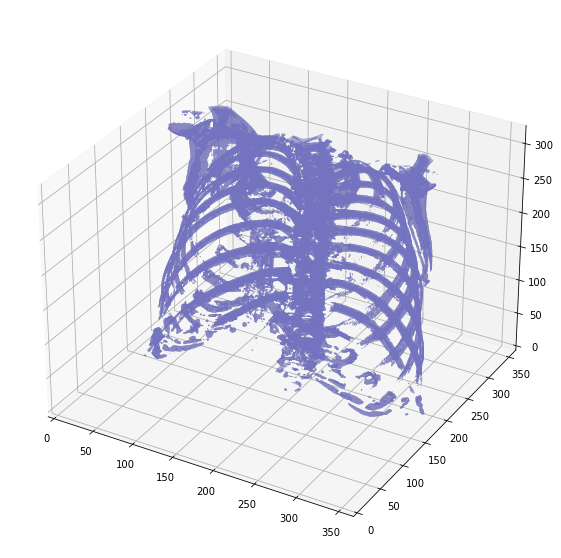

Shape before resampling	 (458, 512, 512)
Shape after resampling	 (286, 360, 360)


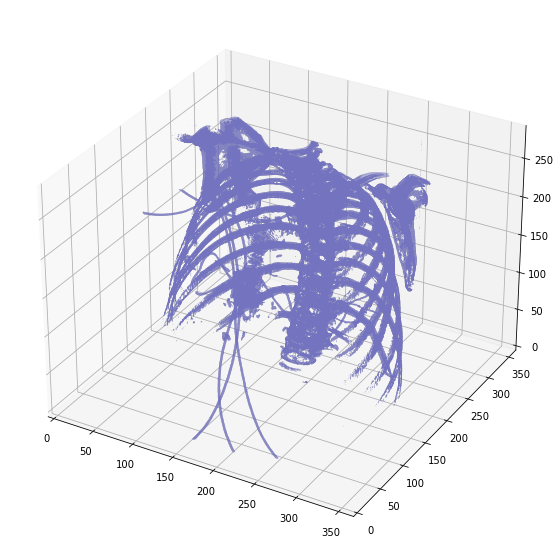

Shape before resampling	 (282, 512, 512)
Shape after resampling	 (352, 379, 379)


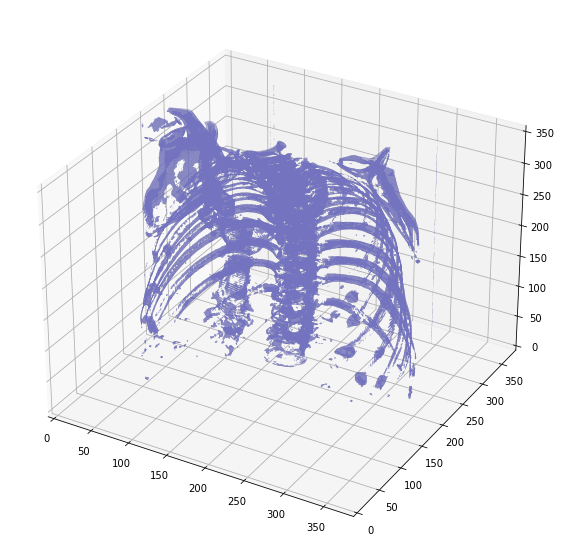

Shape before resampling	 (241, 512, 512)
Shape after resampling	 (301, 360, 360)


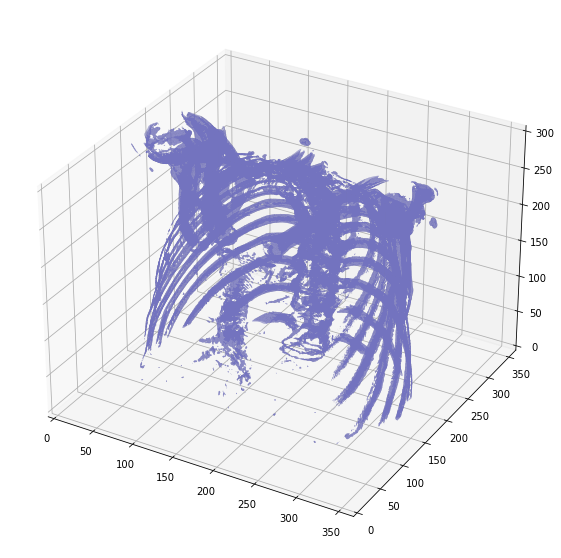

Shape before resampling	 (201, 512, 512)
Shape after resampling	 (251, 360, 360)


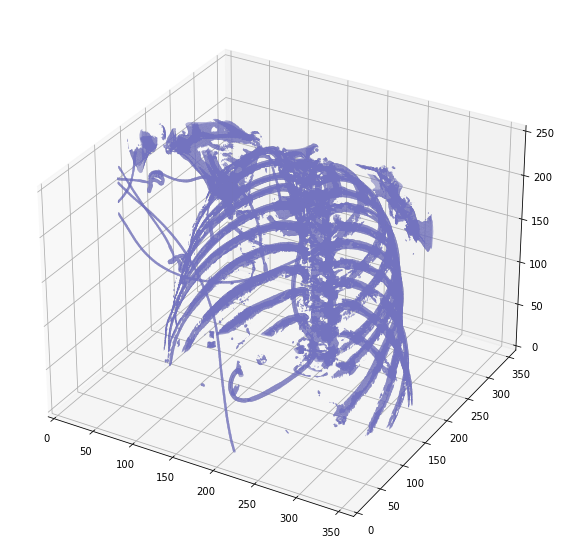

In [25]:
for patient in list_of_patients_a[:5]:
    raw_data = load_scan(patient)
    pixel_data = get_pixels_hu(raw_data)
    #show_all_frames(pixel_data)
    
    resampled_data, spacing = resample(pixel_data, raw_data, [1,1,1])
    print("Shape before resampling\t", pixel_data.shape)
    print("Shape after resampling\t", resampled_data.shape)
    
    plot_3d(resampled_data, 400)

Shape before resampling	 (255, 512, 512)
Shape after resampling	 (200, 400, 400)


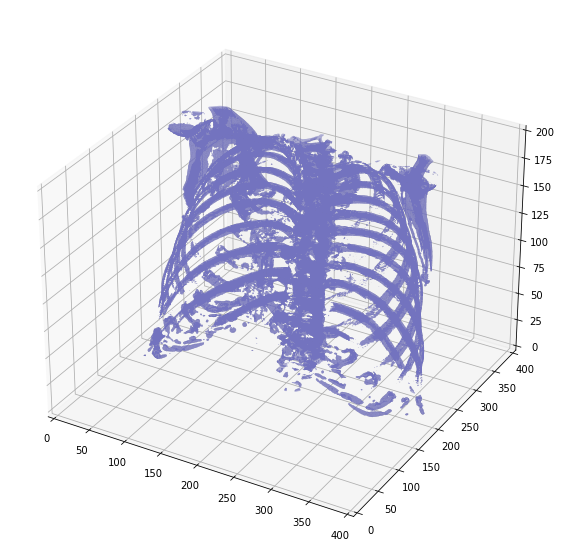

Shape before resampling	 (458, 512, 512)
Shape after resampling	 (200, 400, 400)


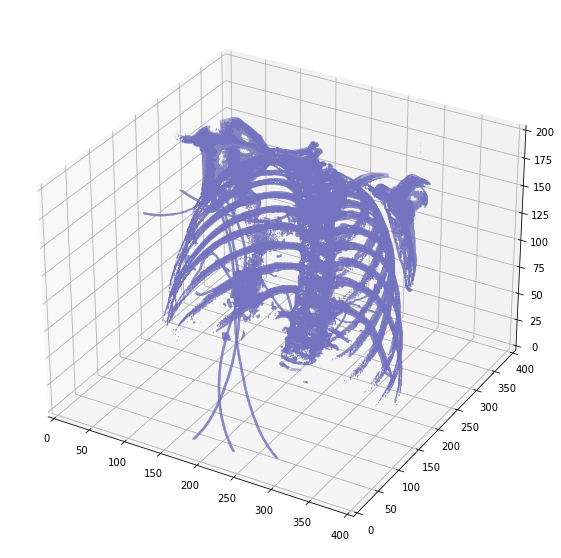

Shape before resampling	 (282, 512, 512)
Shape after resampling	 (200, 400, 400)


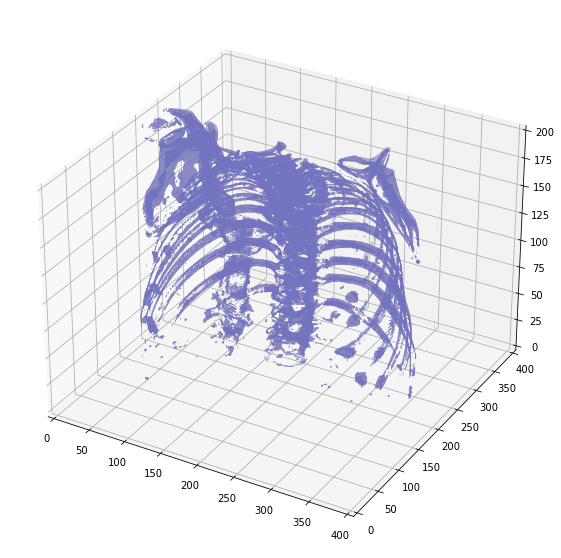

KeyboardInterrupt: 

In [30]:
for patient in list_of_patients_a[:5]:
    raw_data = load_scan(patient)
    pixel_data = get_pixels_hu(raw_data)
    #show_all_frames(pixel_data)
    
    resampled_data = resample_size(pixel_data, [200,400,400])
    print("Shape before resampling\t", pixel_data.shape)
    print("Shape after resampling\t", resampled_data.shape)
    
    plot_3d(resampled_data, 400)

### Final Data Preprocessing

In [38]:
positive = []
negative = []

SHAPE = [255, 512, 512]
counter = 0
for patient in list_of_patients_a[:50]:
    counter +=1
    print("Done",counter)
    raw_data = load_scan(patient)
    pixel_data = get_pixels_hu(raw_data)
    
    resampled_data = resample_size(pixel_data, SHAPE)
    positive.append(normalize(resampled_data))

print("Positive data processed. Size:",len(positive))



Done 1
Done 2
Done 3
Done 4
Done 5
Done 6
Done 7
Done 8
Done 9
Done 10
Done 11
Done 12
Done 13
Done 14
Done 15
Done 16
Done 17
Done 18
Done 19
Done 20
Done 21
Done 22
Done 23
Done 24
Done 25
Done 26
Done 27
Done 28
Done 29
Done 30
Done 31
Done 32
Done 33
Done 34
Done 35
Done 36
Done 37
Done 38
Done 39
Done 40


ValueError: all input arrays must have the same shape

In [39]:
print("Positive data processed. Size:",len(positive))

Positive data processed. Size: 39


In [41]:
counter = 0
for patient in list_of_patients_b[:50]:
    counter +=1
    print("Done",counter)
    raw_data = load_scan(patient)
    pixel_data = get_pixels_hu(raw_data)
    
    resampled_data = resample_size(pixel_data, SHAPE)
    negative.append(normalize(resampled_data))

print("Negative data processed. Size:",len(negative))

Done 1
Done 2
Done 3
Done 4
Done 5
Done 6
Done 7
Done 8
Done 9
Done 10
Done 11
Done 12
Done 13
Done 14
Done 15
Done 16
Done 17
Done 18
Done 19
Done 20
Done 21
Done 22
Done 23
Done 24
Done 25
Done 26
Done 27
Done 28
Done 29
Done 30
Done 31
Done 32
Done 33
Done 34
Done 35
Done 36
Done 37
Done 38
Done 39
Done 40
Done 41
Done 42
Done 43
Done 44
Done 45
Done 46
Done 47
Done 48
Done 49
Done 50
Negative data processed. Size: 50


In [43]:
counter = 60
for patient in list_of_patients_a[60:100]:
    counter +=1
    print("Done",counter)
    raw_data = load_scan(patient)
    pixel_data = get_pixels_hu(raw_data)
    
    resampled_data = resample_size(pixel_data, SHAPE)
    positive.append(normalize(resampled_data))

print("Positive data processed. Size:",len(positive))

Done 61
Done 62
Done 63
Done 64
Done 65
Done 66
Done 67
Done 68
Done 69
Done 70
Done 71
Done 72
Done 73
Done 74
Done 75
Done 76
Done 77
Done 78
Done 79
Done 80
Done 81
Done 82
Done 83
Done 84
Done 85
Done 86
Done 87
Done 88
Done 89
Done 90
Done 91
Done 92


MemoryError: Unable to allocate 255. MiB for an array with shape (255, 512, 512) and data type float32

In [44]:
del positive[80:]

In [45]:
counter = 50
for patient in list_of_patients_b[50:80]:
    counter +=1
    print("Done",counter)
    raw_data = load_scan(patient)
    pixel_data = get_pixels_hu(raw_data)
    
    resampled_data = resample_size(pixel_data, SHAPE)
    negative.append(normalize(resampled_data))

print("Negative data processed. Size:",len(negative))

Done 51
Done 52
Done 53
Done 54
Done 55
Done 56
Done 57
Done 58
Done 59
Done 60
Done 61


MemoryError: Unable to allocate 489. MiB for an array with shape (223, 536, 536) and data type float64

Shape before resampling	 (225, 512, 512)
Shape after resampling	 (35, 45, 45)


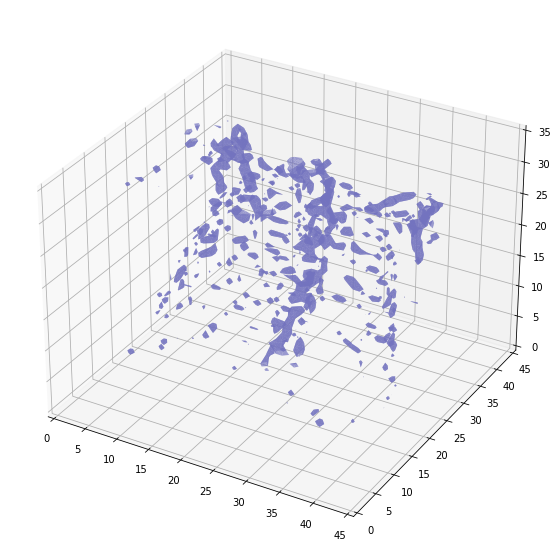

Shape before resampling	 (216, 512, 512)
Shape after resampling	 (34, 38, 38)


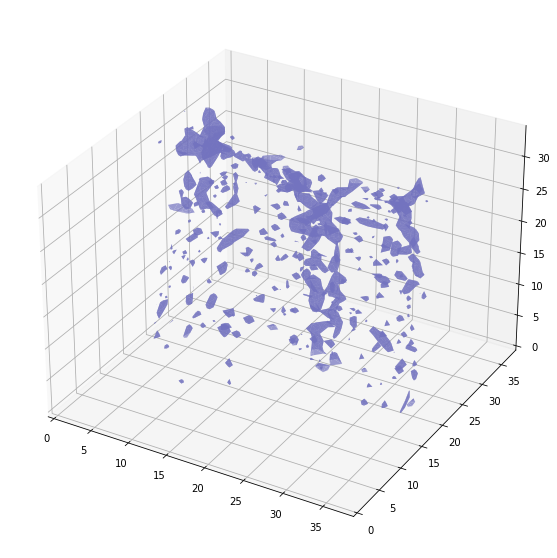

Shape before resampling	 (251, 512, 512)
Shape after resampling	 (39, 45, 45)


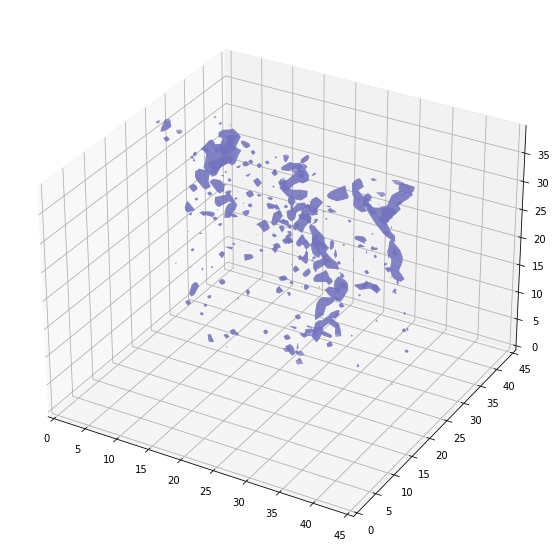

Shape before resampling	 (205, 512, 512)
Shape after resampling	 (32, 41, 41)


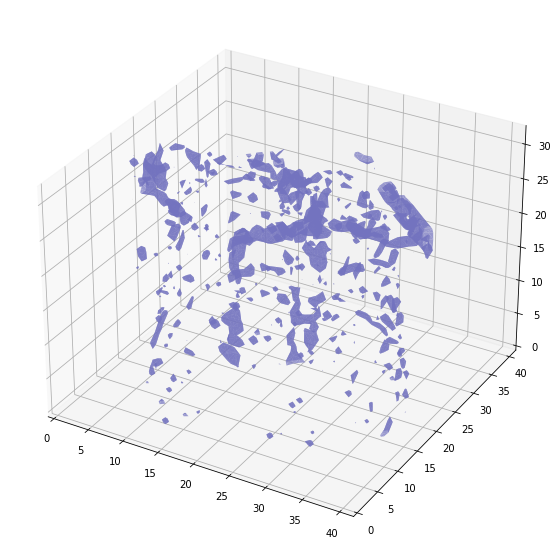

Shape before resampling	 (241, 512, 512)
Shape after resampling	 (38, 36, 36)


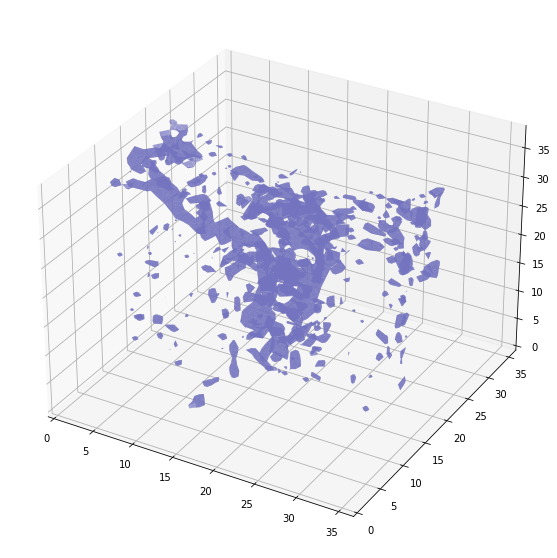

Shape before resampling	 (259, 512, 512)
Shape after resampling	 (40, 46, 46)


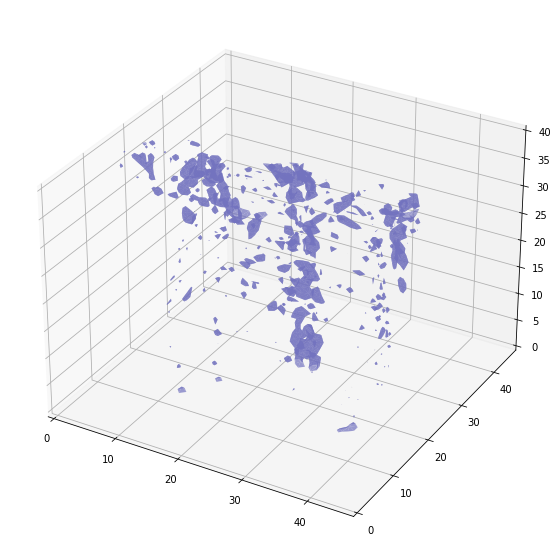

Shape before resampling	 (262, 512, 512)
Shape after resampling	 (41, 62, 62)


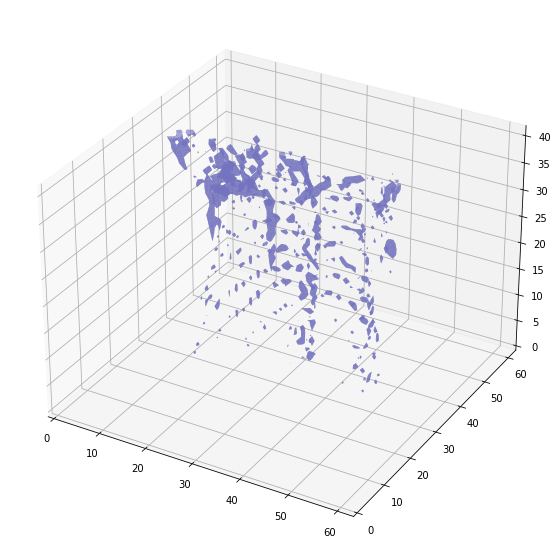

Shape before resampling	 (268, 512, 512)
Shape after resampling	 (42, 45, 45)


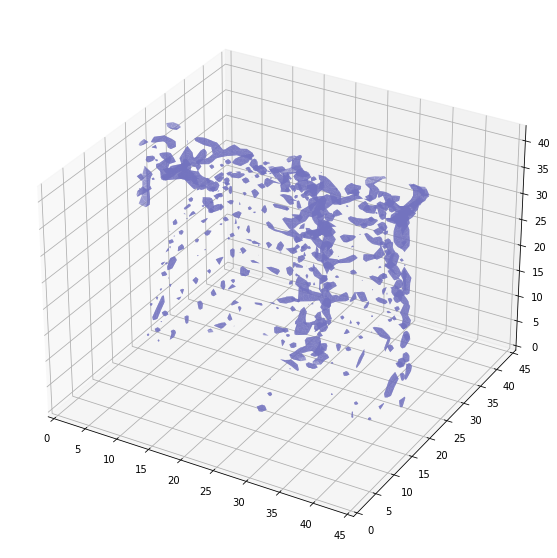

Shape before resampling	 (292, 512, 512)
Shape after resampling	 (46, 56, 56)


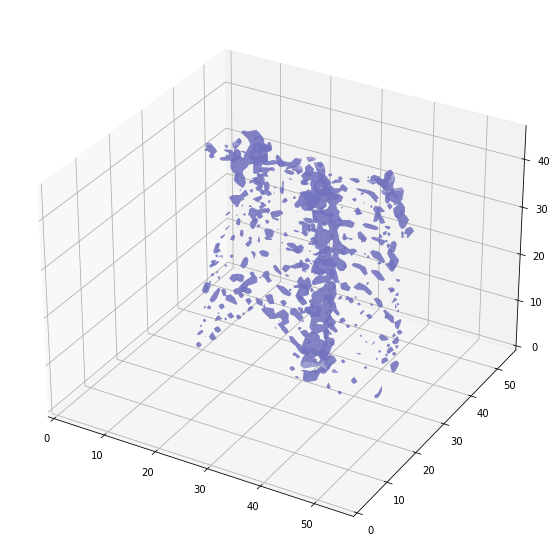

Shape before resampling	 (265, 512, 512)
Shape after resampling	 (83, 45, 45)


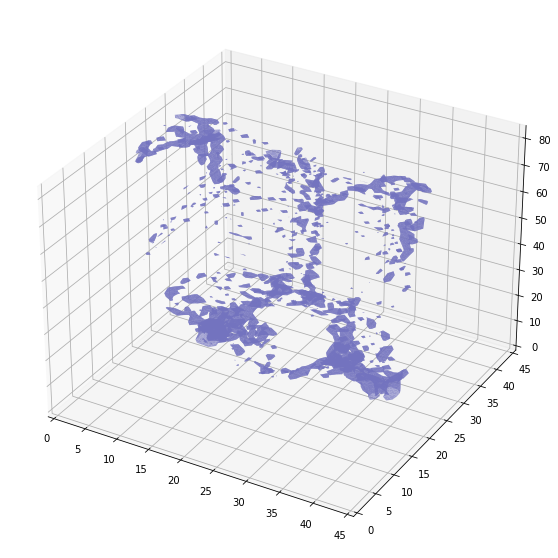

Shape before resampling	 (262, 512, 512)
Shape after resampling	 (41, 62, 62)


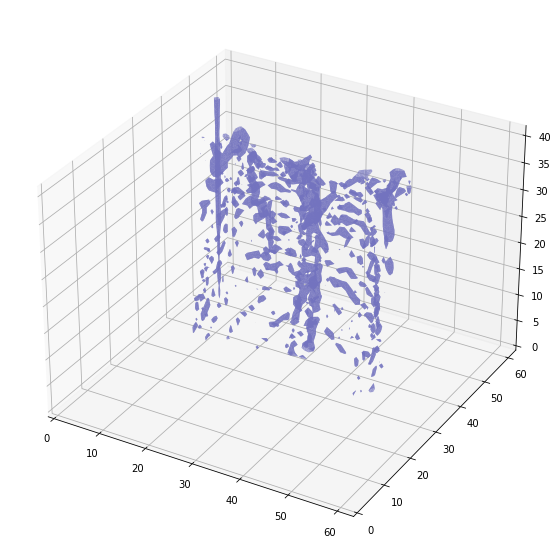

Shape before resampling	 (293, 512, 512)
Shape after resampling	 (46, 46, 46)


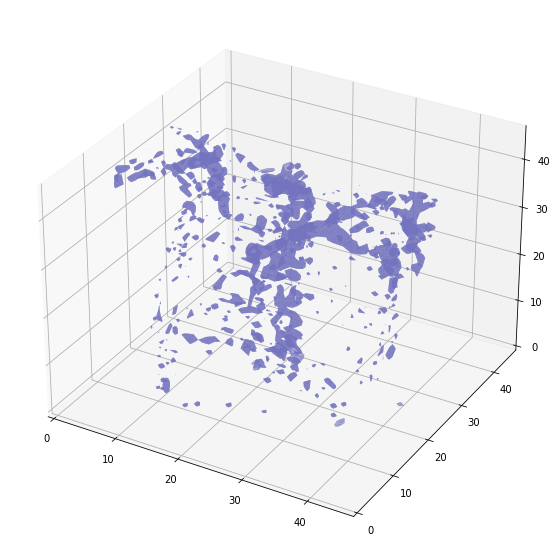

Shape before resampling	 (253, 512, 512)
Shape after resampling	 (40, 36, 36)


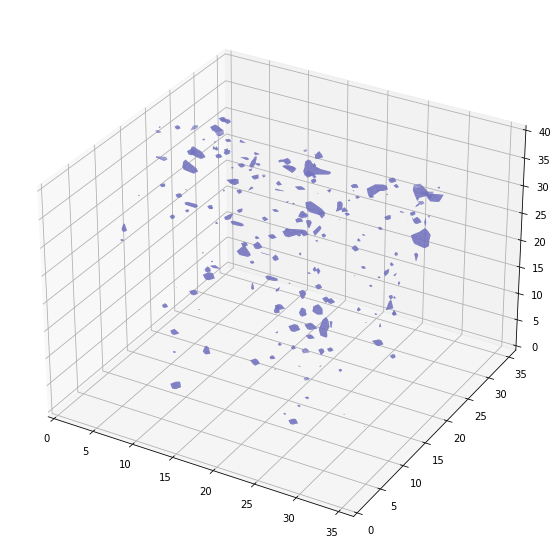

Shape before resampling	 (270, 512, 512)
Shape after resampling	 (42, 48, 48)


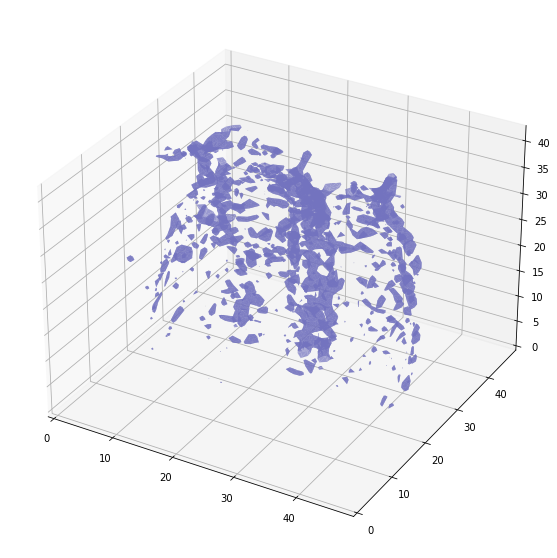

Shape before resampling	 (254, 512, 512)
Shape after resampling	 (40, 45, 45)


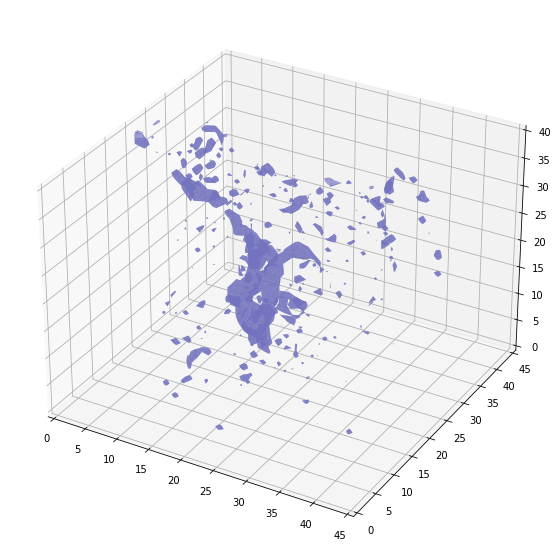

Shape before resampling	 (259, 512, 512)
Shape after resampling	 (40, 45, 45)


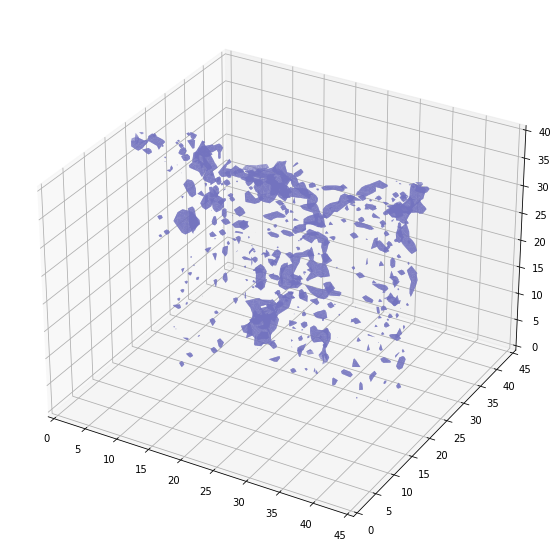

Shape before resampling	 (237, 512, 512)
Shape after resampling	 (37, 38, 38)


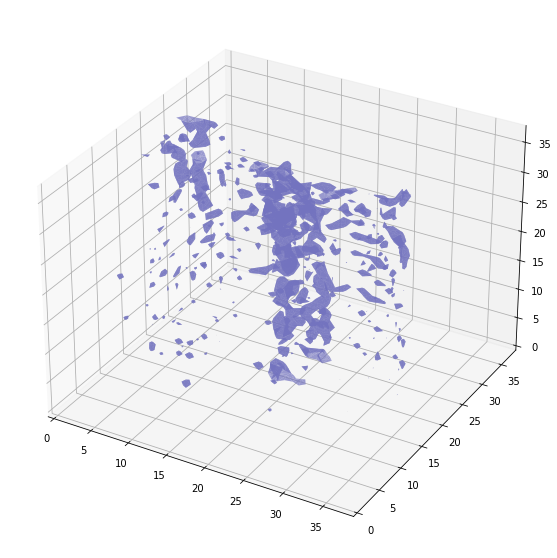

Shape before resampling	 (252, 512, 512)
Shape after resampling	 (39, 41, 41)


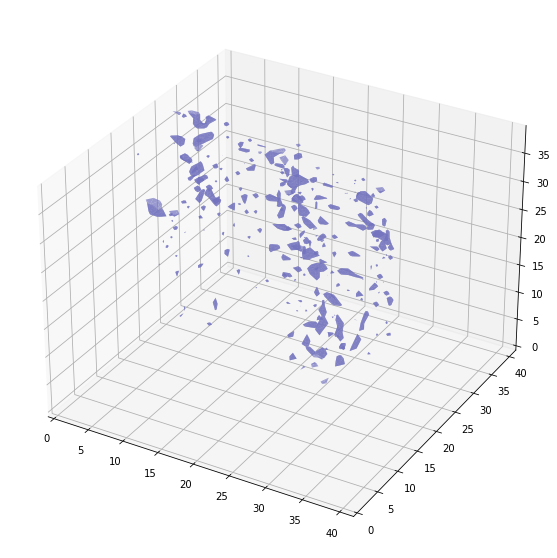

Shape before resampling	 (241, 512, 512)
Shape after resampling	 (38, 55, 55)


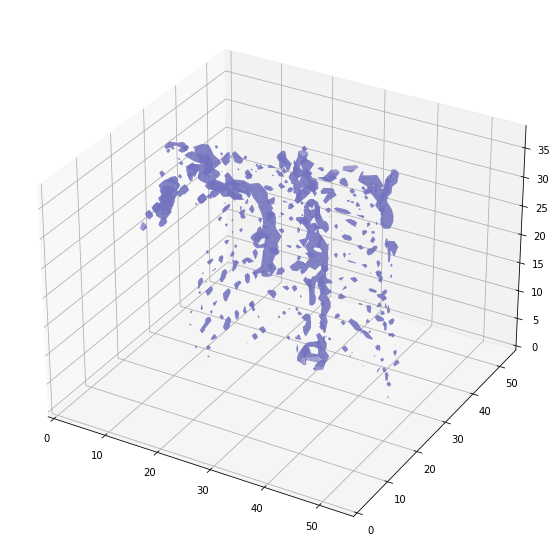

Shape before resampling	 (274, 512, 512)
Shape after resampling	 (43, 42, 42)


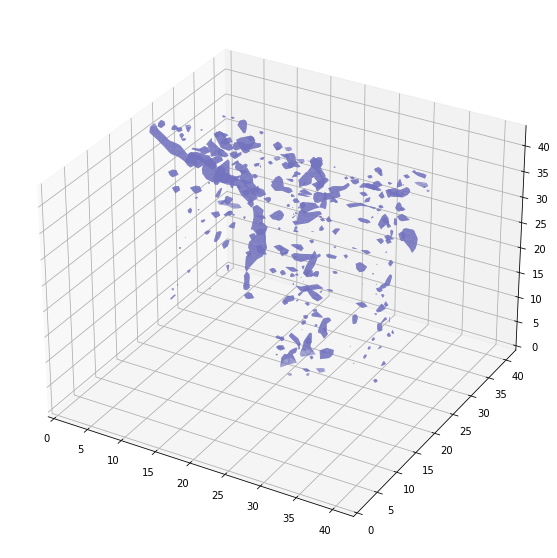

Shape before resampling	 (241, 512, 512)
Shape after resampling	 (38, 45, 45)


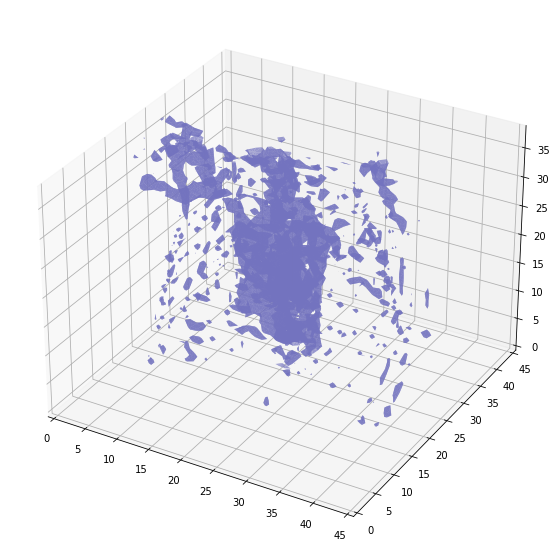

Shape before resampling	 (204, 512, 512)
Shape after resampling	 (32, 50, 50)


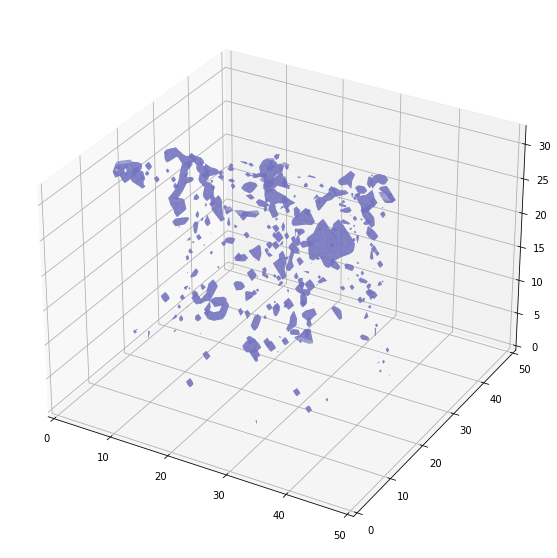

Shape before resampling	 (288, 512, 512)
Shape after resampling	 (45, 45, 45)


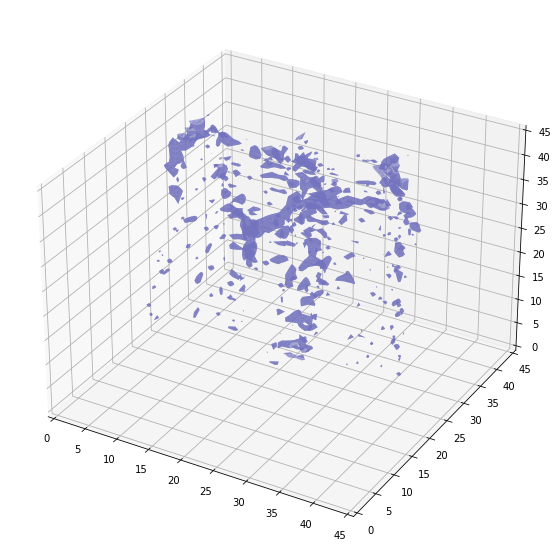

Shape before resampling	 (230, 512, 512)
Shape after resampling	 (36, 38, 38)


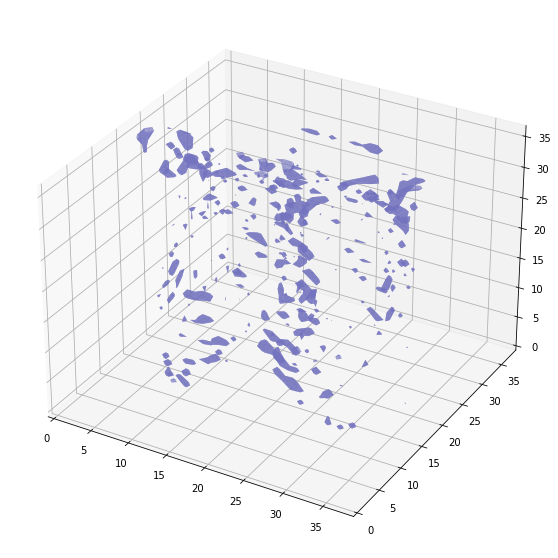

Shape before resampling	 (226, 512, 512)
Shape after resampling	 (35, 45, 45)


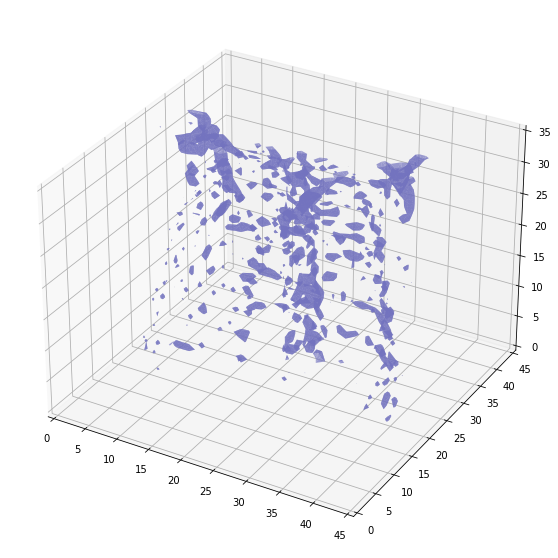

Shape before resampling	 (291, 512, 512)
Shape after resampling	 (45, 46, 46)


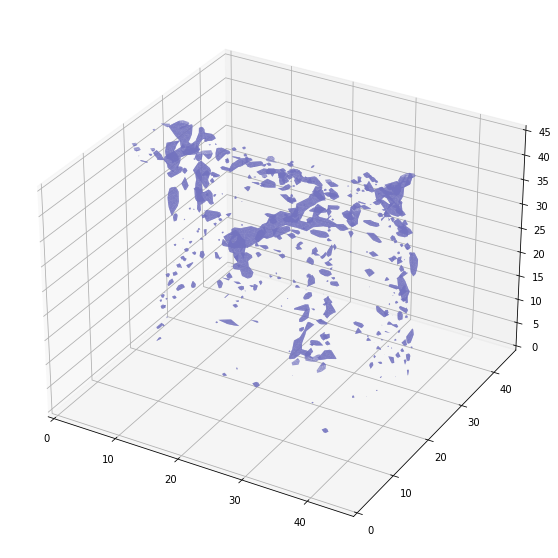

Shape before resampling	 (244, 512, 512)
Shape after resampling	 (38, 51, 51)


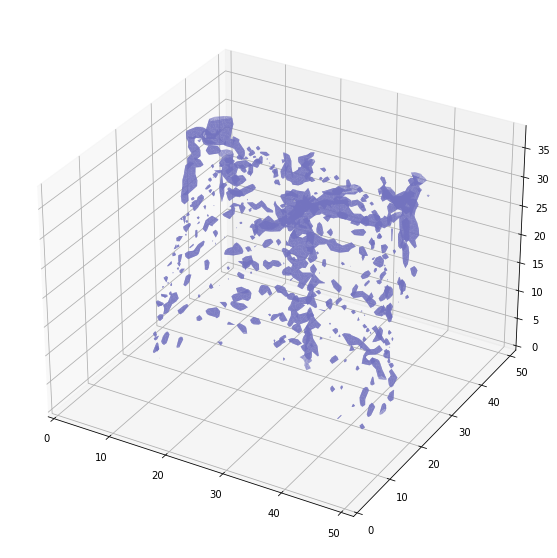

Shape before resampling	 (228, 512, 512)
Shape after resampling	 (36, 40, 40)


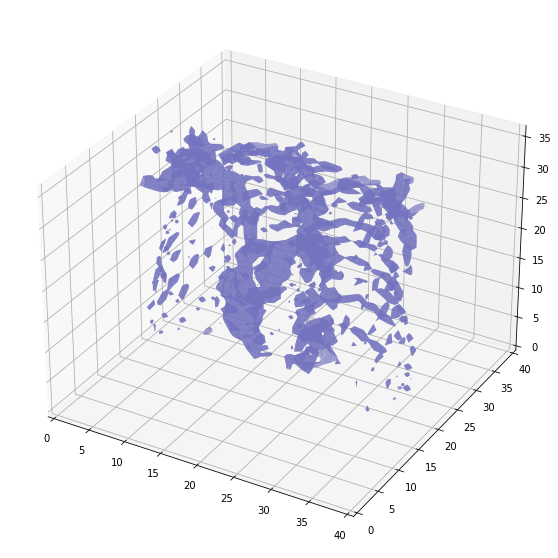

Shape before resampling	 (242, 512, 512)
Shape after resampling	 (38, 48, 48)


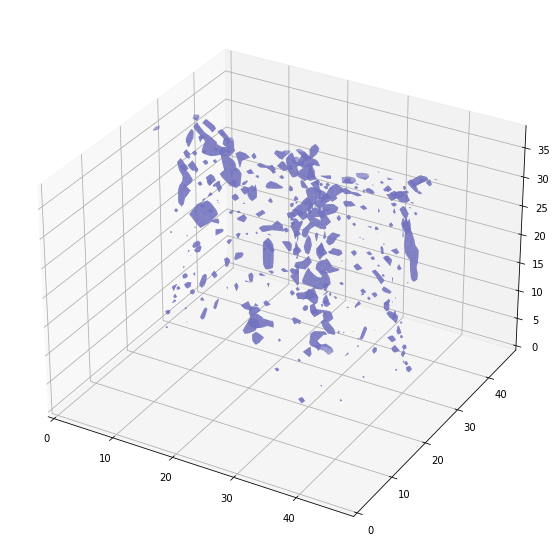

Shape before resampling	 (76, 512, 512)
Shape after resampling	 (28, 41, 41)


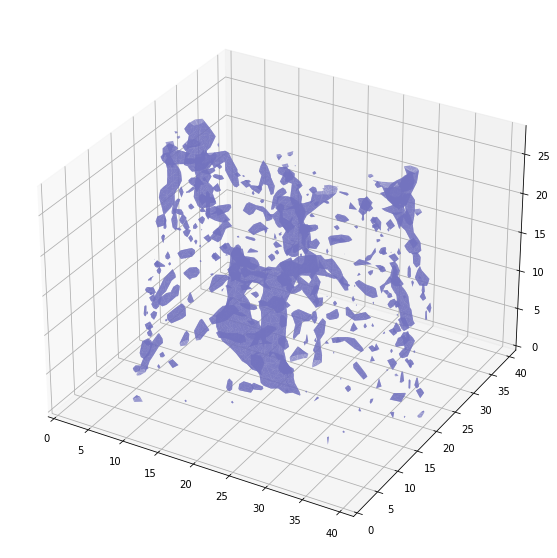

Shape before resampling	 (103, 512, 512)
Shape after resampling	 (39, 41, 41)


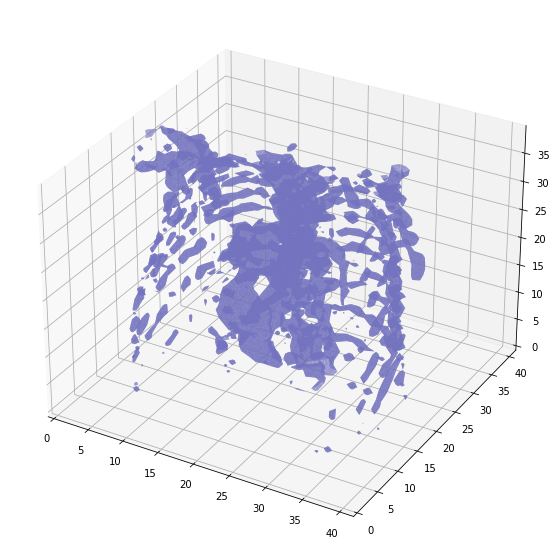

Shape before resampling	 (564, 512, 512)
Shape after resampling	 (35, 36, 36)


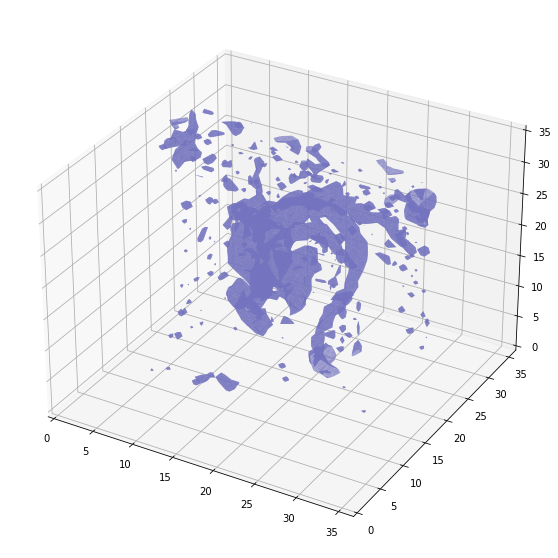

Shape before resampling	 (92, 512, 512)
Shape after resampling	 (34, 46, 46)


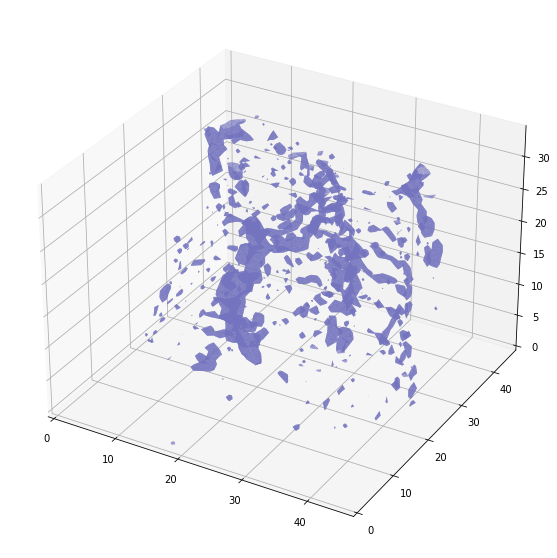

Shape before resampling	 (89, 512, 512)
Shape after resampling	 (33, 34, 34)


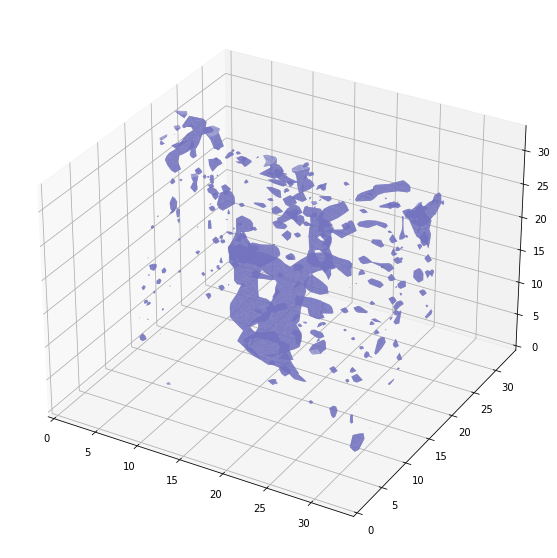

Shape before resampling	 (76, 512, 512)
Shape after resampling	 (28, 33, 33)


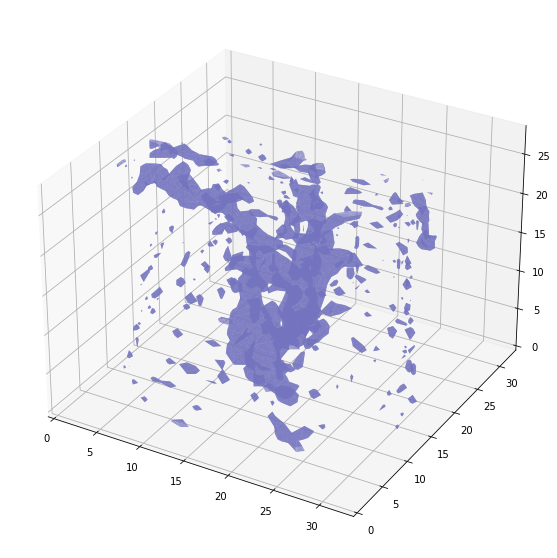

Shape before resampling	 (87, 512, 512)
Shape after resampling	 (33, 40, 40)


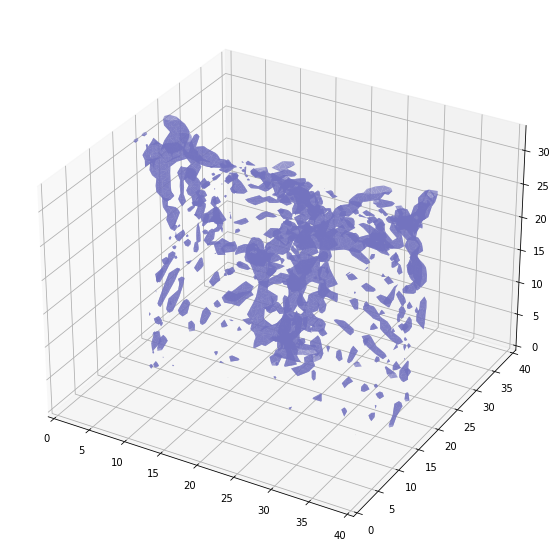

Shape before resampling	 (92, 512, 512)
Shape after resampling	 (34, 44, 44)


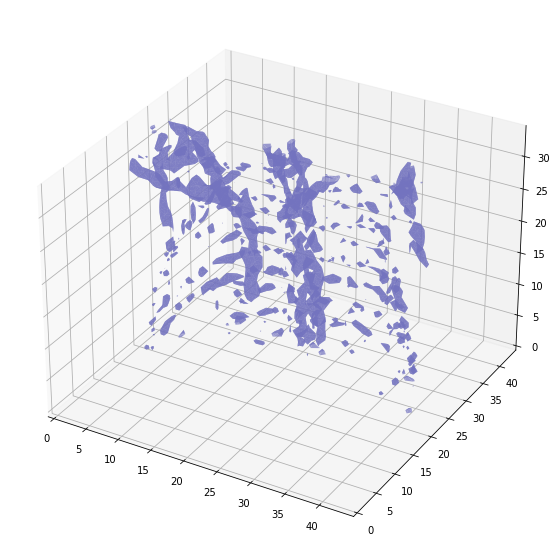

Shape before resampling	 (98, 512, 512)
Shape after resampling	 (37, 55, 55)


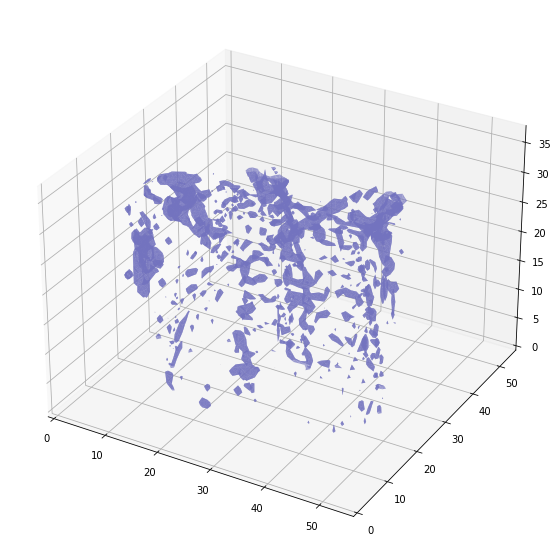

Shape before resampling	 (87, 512, 512)
Shape after resampling	 (33, 50, 50)


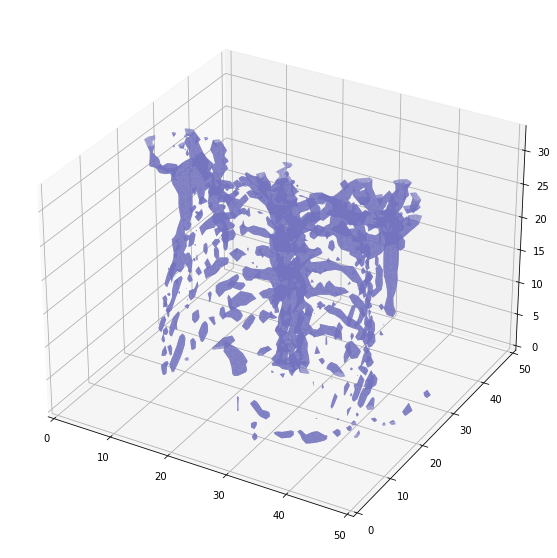

Shape before resampling	 (211, 512, 512)
Shape after resampling	 (33, 48, 48)


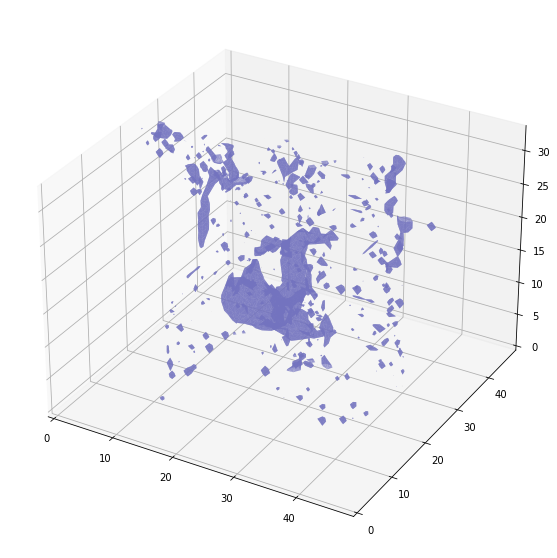

Shape before resampling	 (102, 512, 512)
Shape after resampling	 (38, 44, 44)


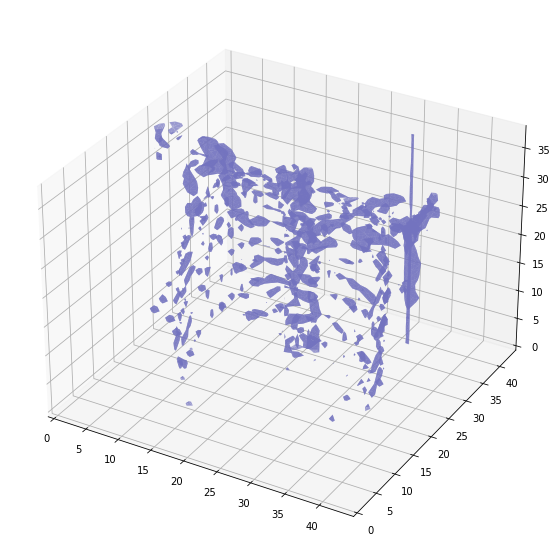

Shape before resampling	 (108, 512, 512)
Shape after resampling	 (40, 56, 56)


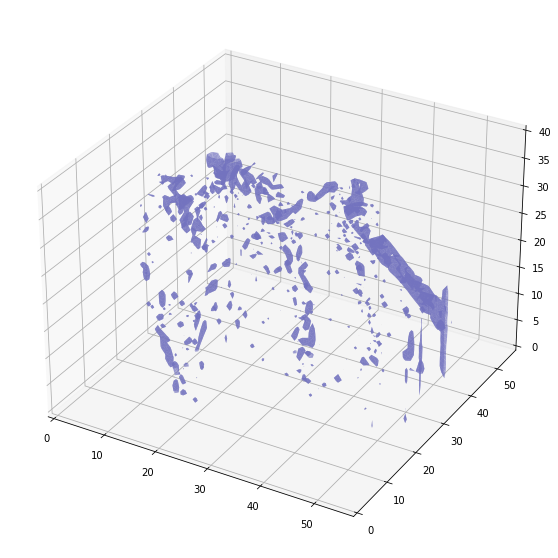

Shape before resampling	 (106, 512, 512)
Shape after resampling	 (40, 45, 45)


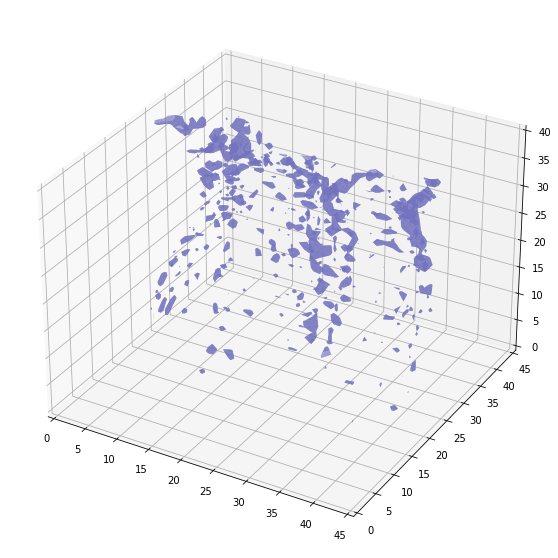

Shape before resampling	 (109, 512, 512)
Shape after resampling	 (41, 38, 38)


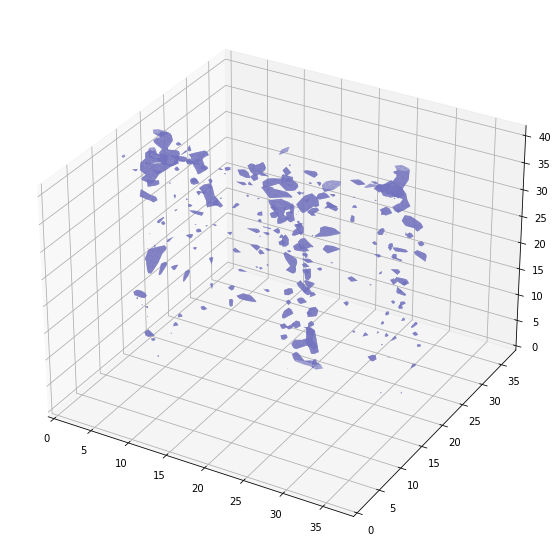

Shape before resampling	 (106, 512, 512)
Shape after resampling	 (40, 44, 44)


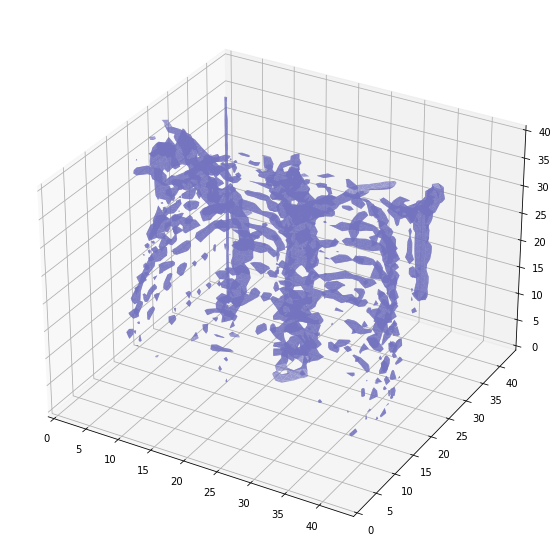

Shape before resampling	 (95, 512, 512)
Shape after resampling	 (36, 40, 40)


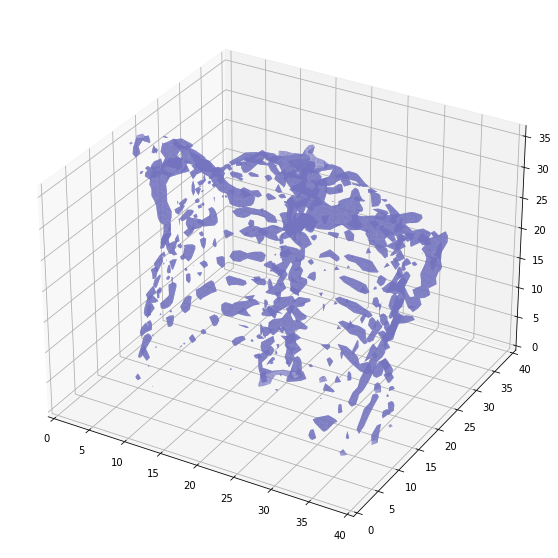

Shape before resampling	 (95, 512, 512)
Shape after resampling	 (36, 38, 38)


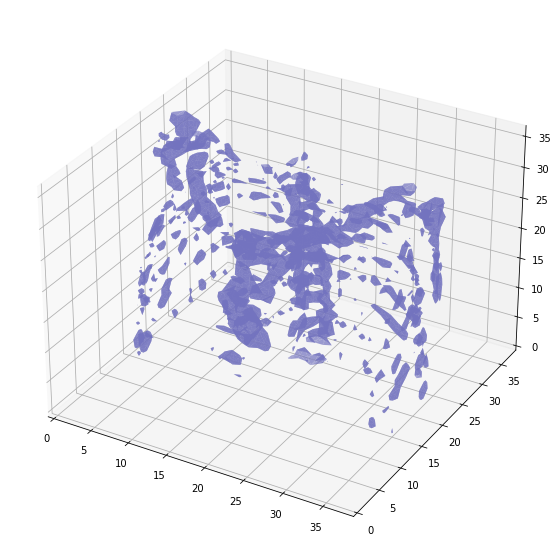

Shape before resampling	 (89, 512, 512)
Shape after resampling	 (33, 44, 44)


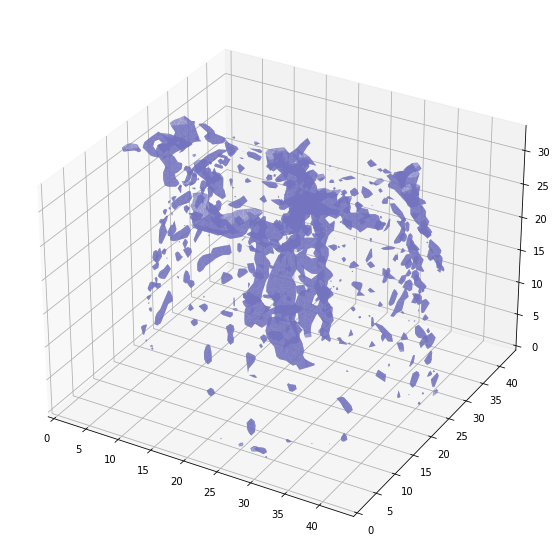

Shape before resampling	 (84, 512, 512)
Shape after resampling	 (32, 35, 35)


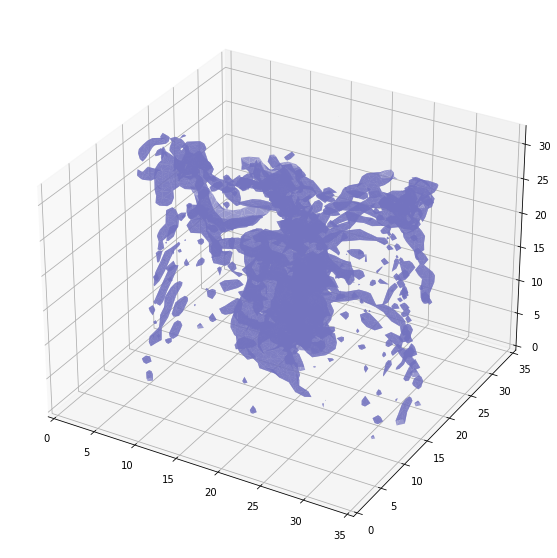

Shape before resampling	 (103, 512, 512)
Shape after resampling	 (39, 60, 60)


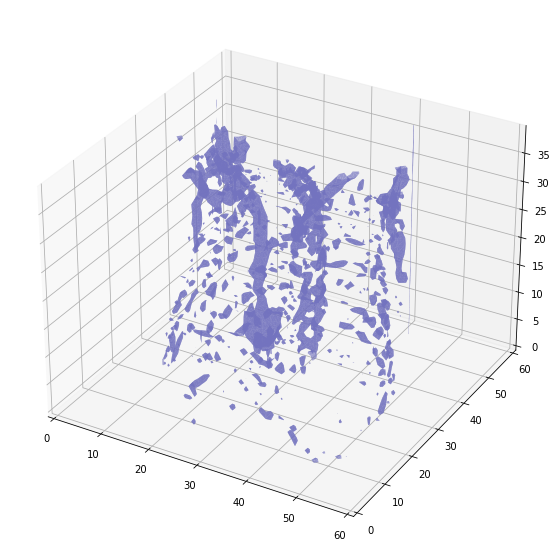

Shape before resampling	 (89, 512, 512)
Shape after resampling	 (33, 41, 41)


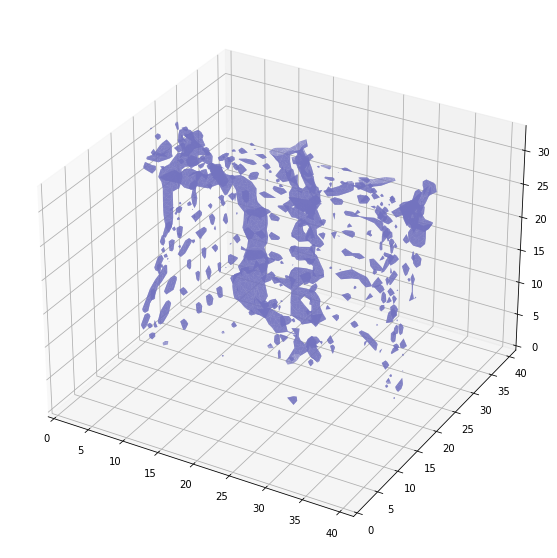

Shape before resampling	 (85, 512, 512)
Shape after resampling	 (32, 33, 33)


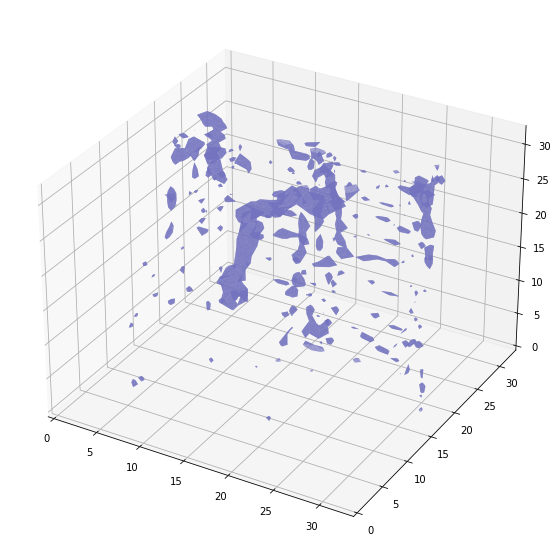

Shape before resampling	 (220, 512, 512)
Shape after resampling	 (34, 37, 37)


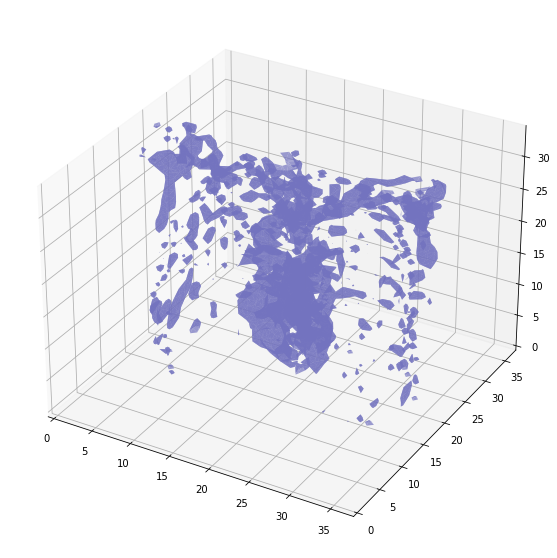

Shape before resampling	 (261, 512, 512)
Shape after resampling	 (41, 37, 37)


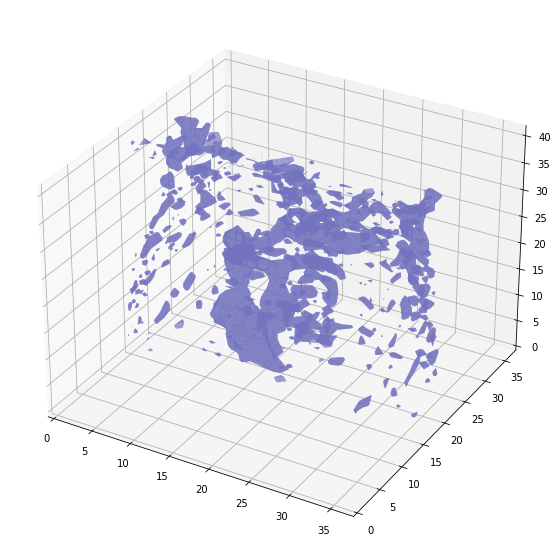

Shape before resampling	 (274, 512, 512)
Shape after resampling	 (43, 45, 45)


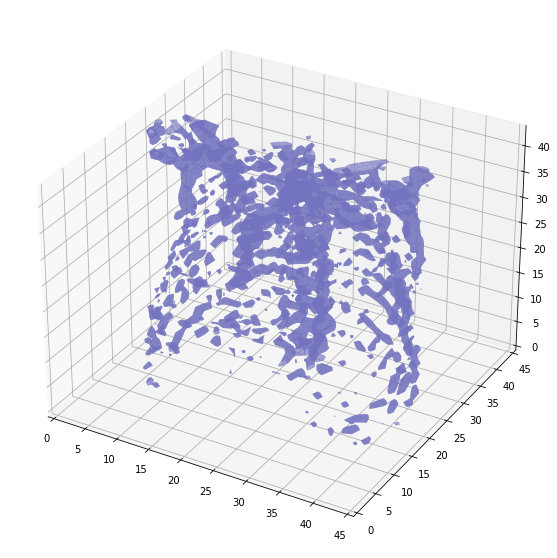

Shape before resampling	 (102, 512, 512)
Shape after resampling	 (38, 51, 51)


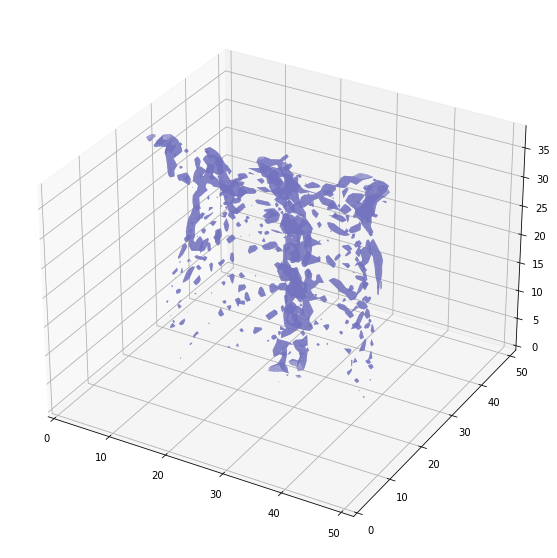

Shape before resampling	 (87, 512, 512)
Shape after resampling	 (33, 50, 50)


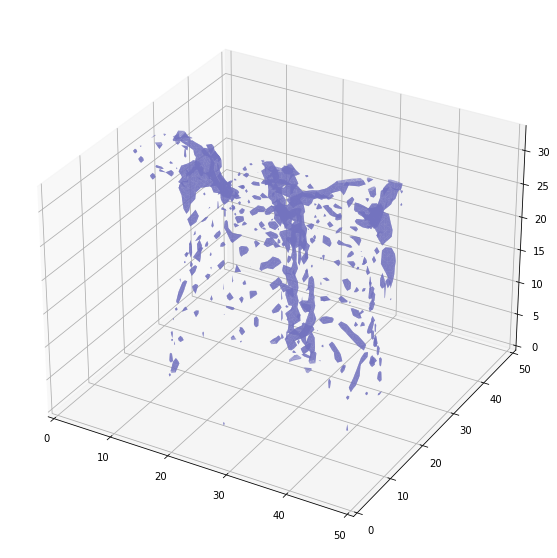

Shape before resampling	 (104, 512, 512)
Shape after resampling	 (39, 54, 54)


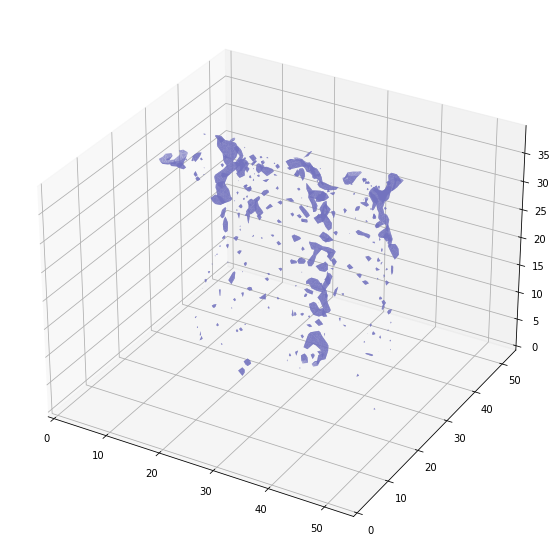

Shape before resampling	 (229, 512, 512)
Shape after resampling	 (36, 45, 45)


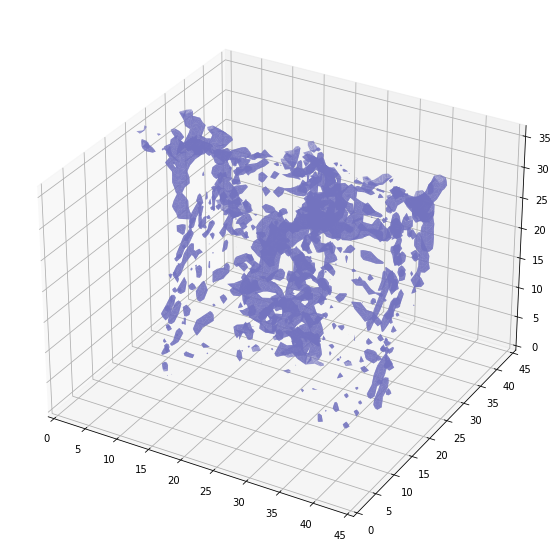

Shape before resampling	 (109, 512, 512)
Shape after resampling	 (41, 45, 45)


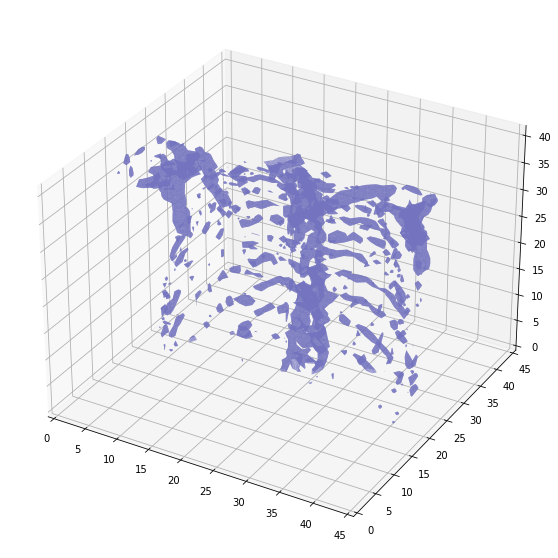

Shape before resampling	 (199, 512, 512)
Shape after resampling	 (37, 41, 41)


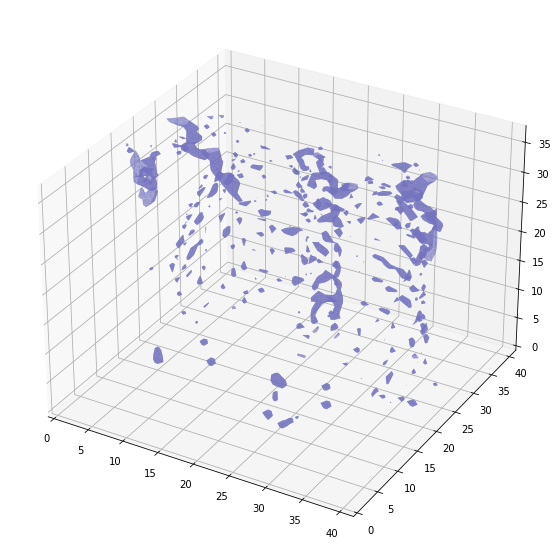

Shape before resampling	 (215, 512, 512)
Shape after resampling	 (40, 39, 39)


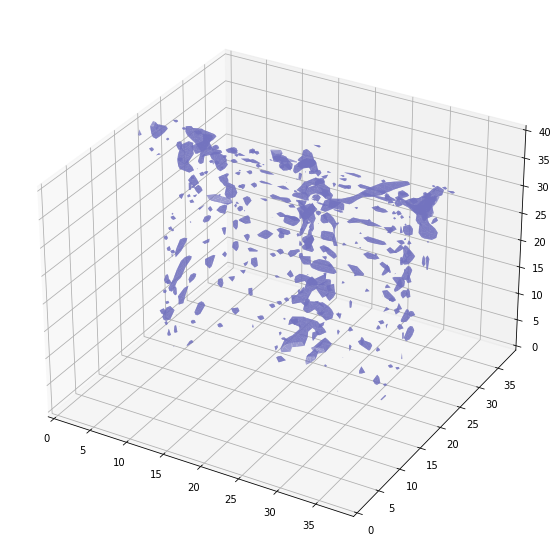

Shape before resampling	 (248, 512, 512)
Shape after resampling	 (46, 51, 51)


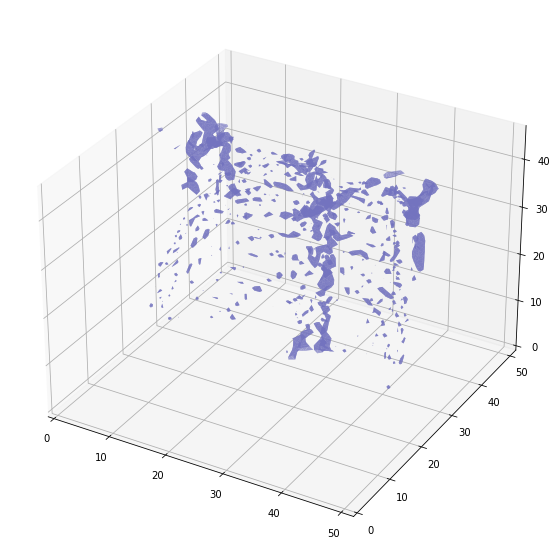

Shape before resampling	 (203, 512, 512)
Shape after resampling	 (51, 48, 48)


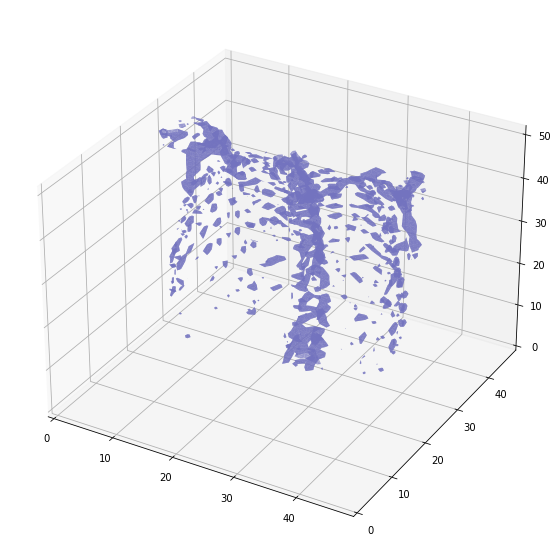

Shape before resampling	 (240, 512, 512)
Shape after resampling	 (45, 52, 52)


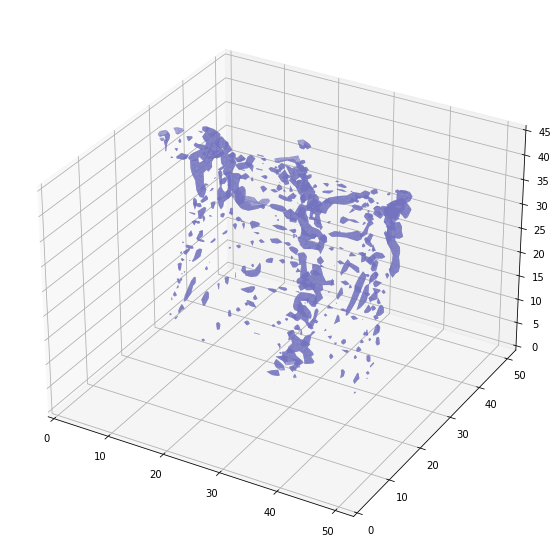

Shape before resampling	 (252, 512, 512)
Shape after resampling	 (47, 50, 50)


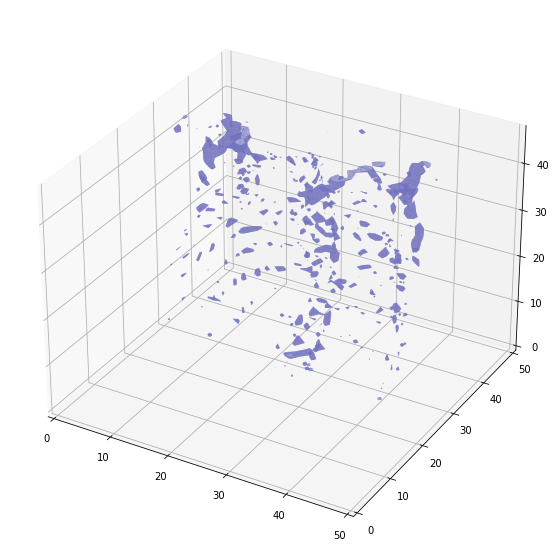

Shape before resampling	 (244, 512, 512)
Shape after resampling	 (46, 54, 54)


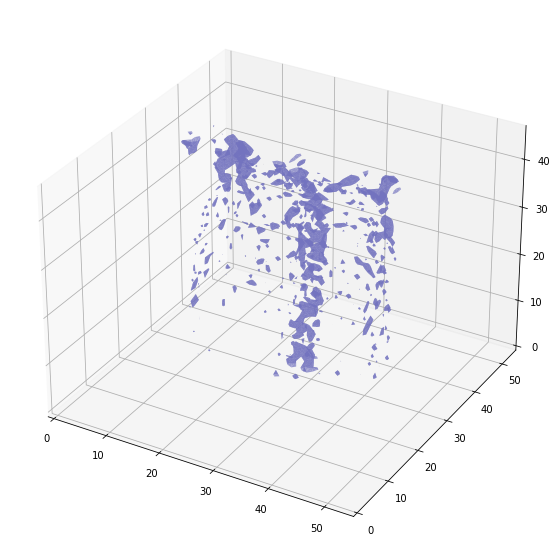

Shape before resampling	 (235, 512, 512)
Shape after resampling	 (44, 52, 52)


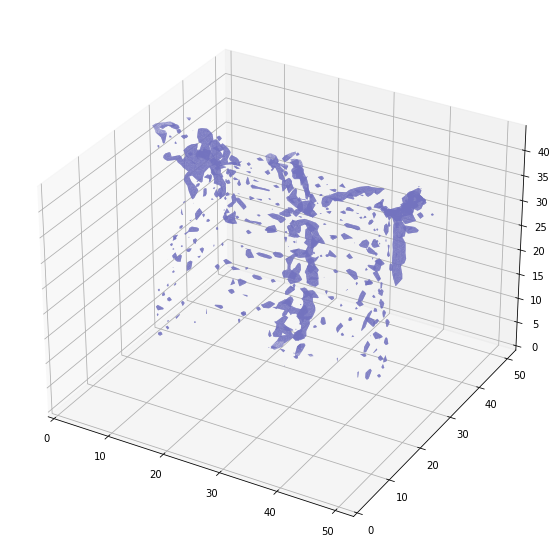

Shape before resampling	 (241, 512, 512)
Shape after resampling	 (45, 50, 50)


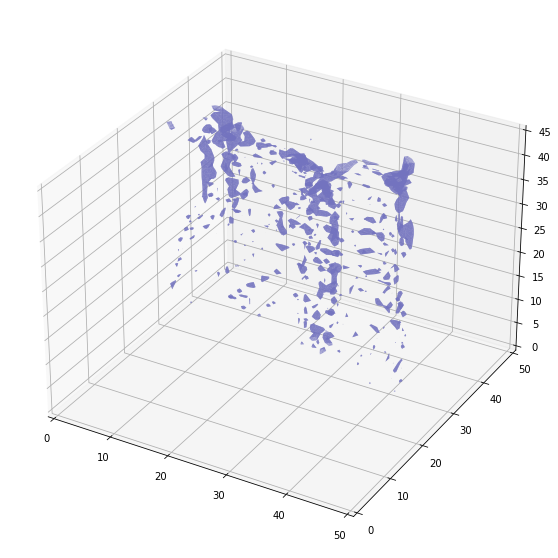

Shape before resampling	 (268, 512, 512)
Shape after resampling	 (50, 46, 46)


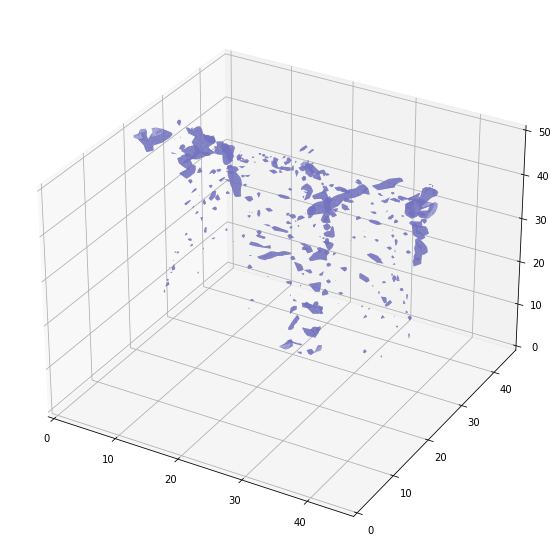

Shape before resampling	 (239, 512, 512)
Shape after resampling	 (45, 42, 42)


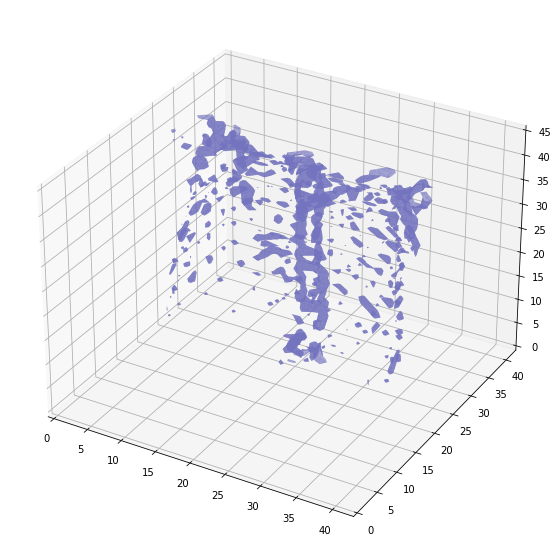

Shape before resampling	 (199, 512, 512)
Shape after resampling	 (37, 42, 42)


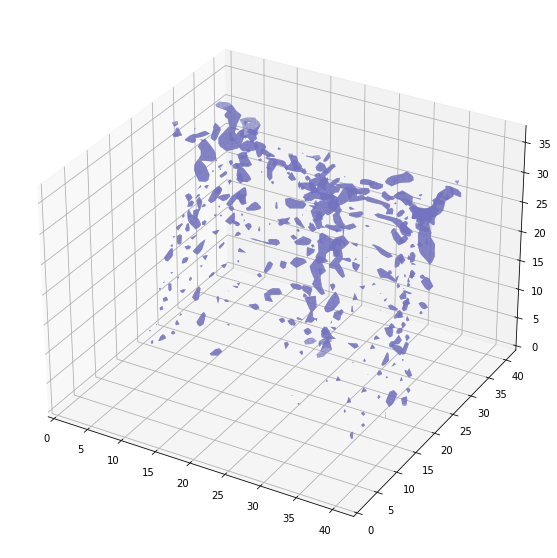

Shape before resampling	 (228, 512, 512)
Shape after resampling	 (43, 49, 49)


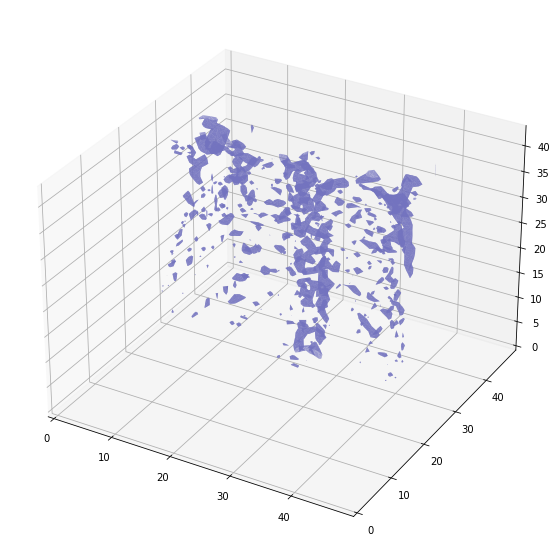

Shape before resampling	 (256, 512, 512)
Shape after resampling	 (48, 53, 53)


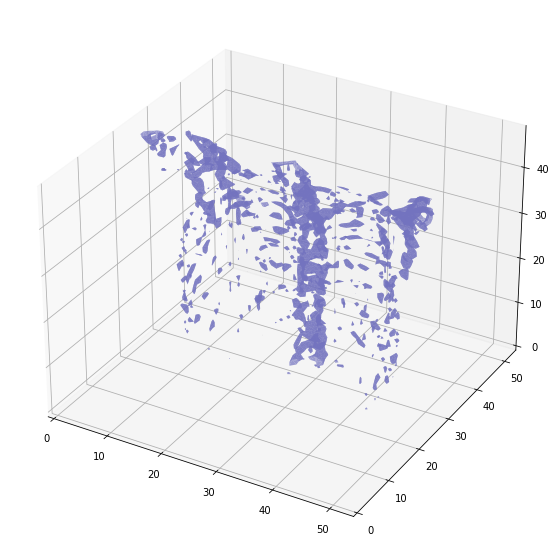

Shape before resampling	 (182, 512, 512)
Shape after resampling	 (34, 43, 43)


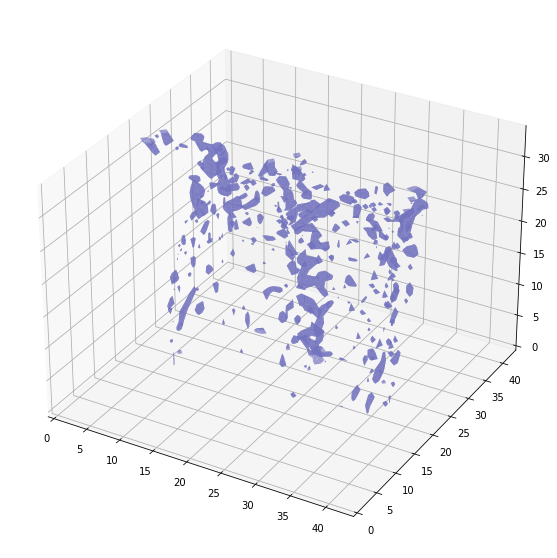

Shape before resampling	 (205, 512, 512)
Shape after resampling	 (38, 43, 43)


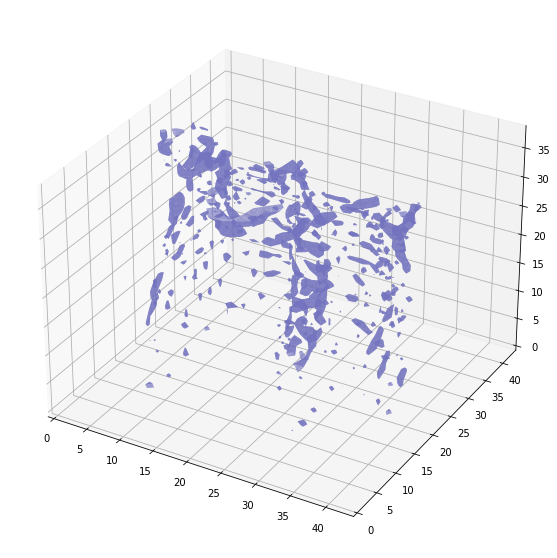

Shape before resampling	 (211, 512, 512)
Shape after resampling	 (40, 42, 42)


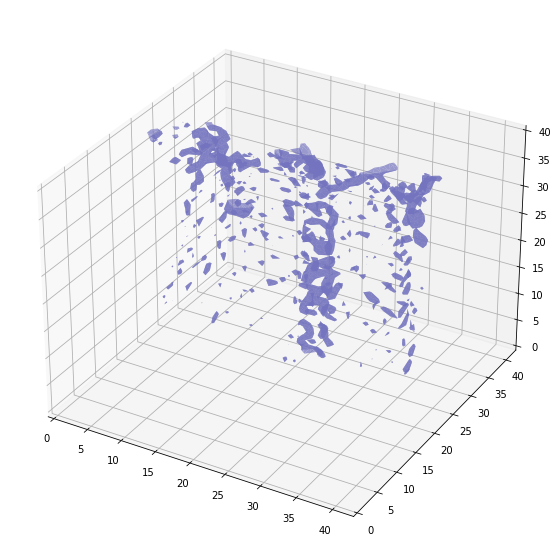

Shape before resampling	 (240, 512, 512)
Shape after resampling	 (45, 48, 48)


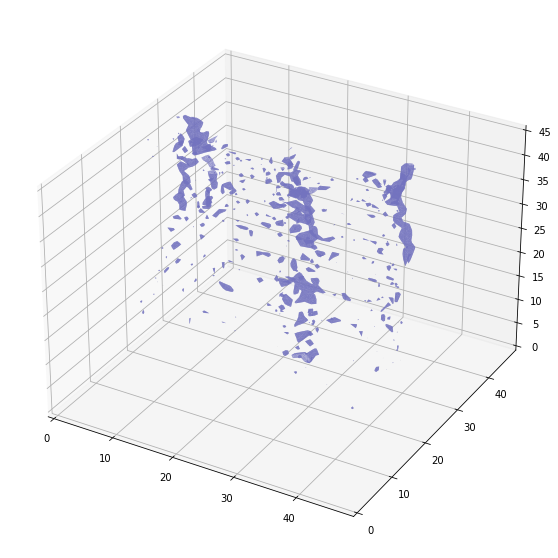

Shape before resampling	 (194, 512, 512)
Shape after resampling	 (36, 42, 42)


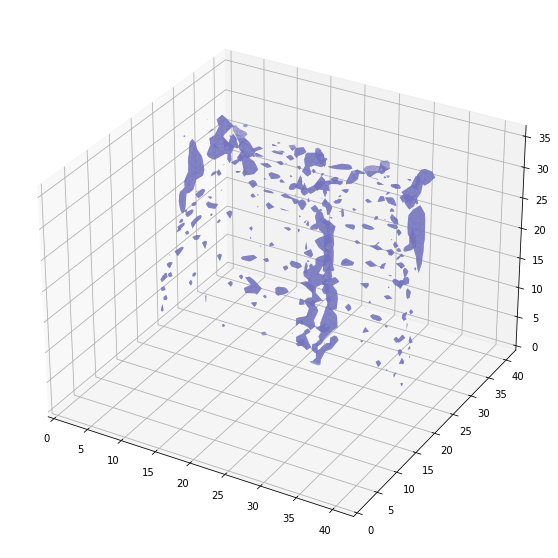

Shape before resampling	 (203, 512, 512)
Shape after resampling	 (38, 41, 41)


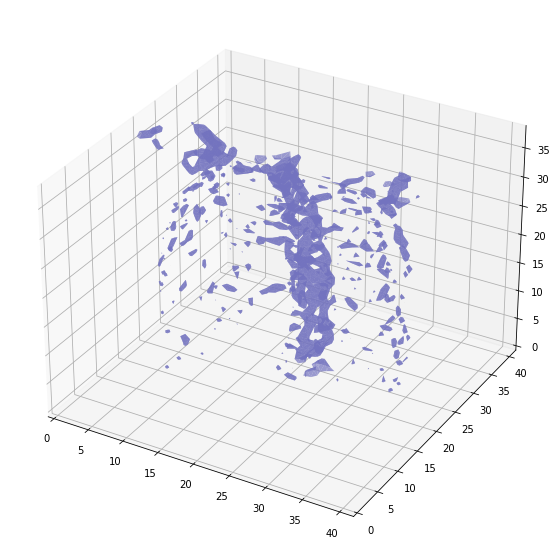

Shape before resampling	 (210, 512, 512)
Shape after resampling	 (39, 41, 41)


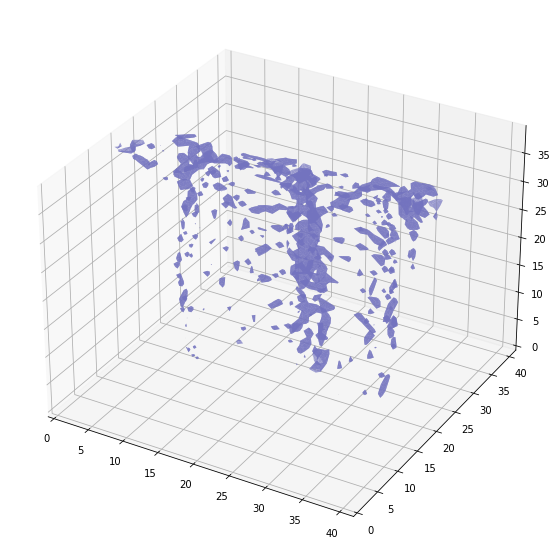

Shape before resampling	 (202, 512, 512)
Shape after resampling	 (38, 43, 43)


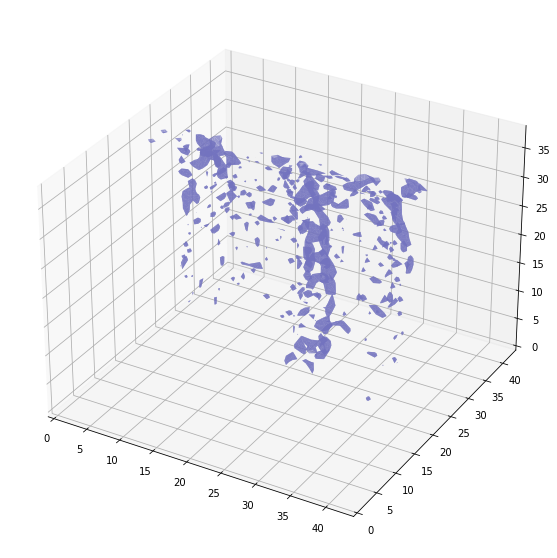

Shape before resampling	 (211, 512, 512)
Shape after resampling	 (40, 48, 48)


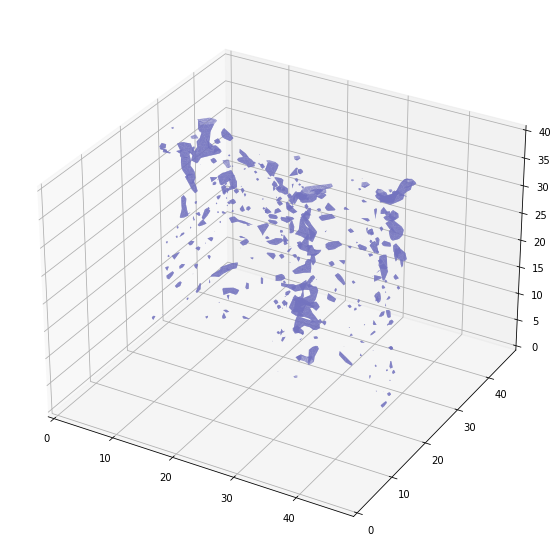

Shape before resampling	 (210, 512, 512)
Shape after resampling	 (39, 47, 47)


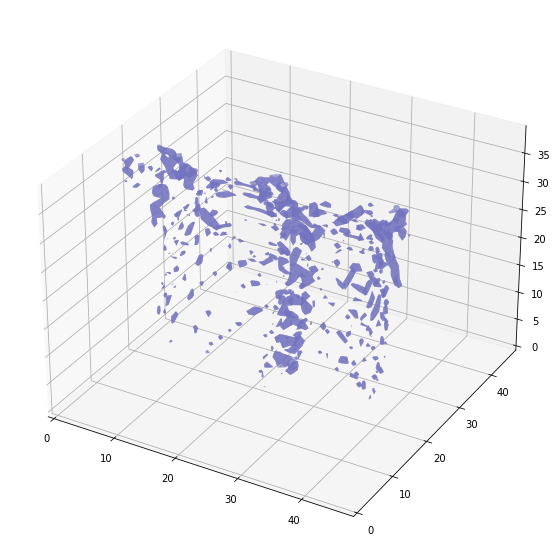

Shape before resampling	 (159, 512, 512)
Shape after resampling	 (30, 49, 49)


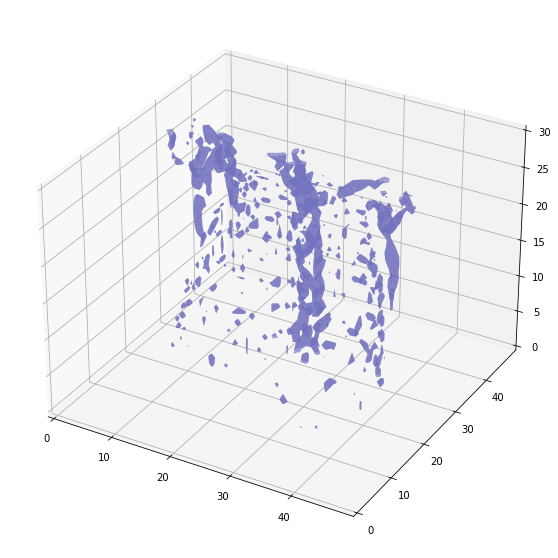

Shape before resampling	 (217, 512, 512)
Shape after resampling	 (41, 38, 38)


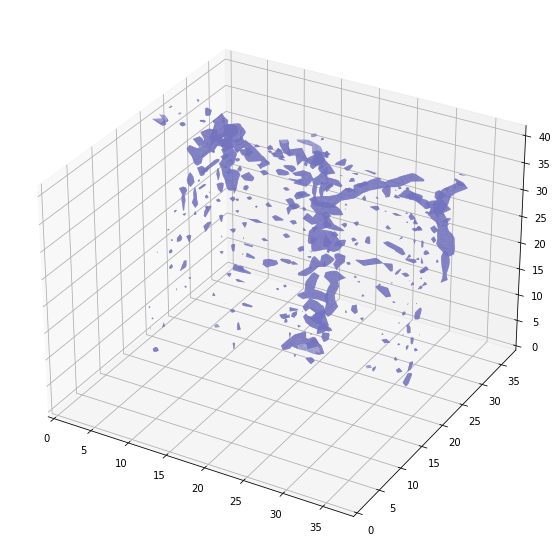

Shape before resampling	 (260, 512, 512)
Shape after resampling	 (49, 58, 58)


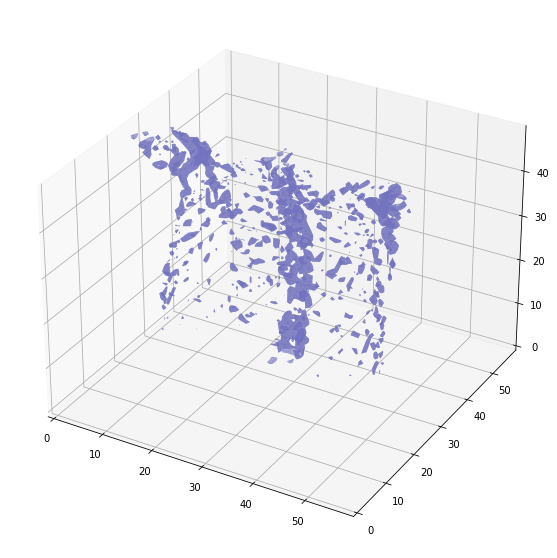

Shape before resampling	 (205, 512, 512)
Shape after resampling	 (38, 37, 37)


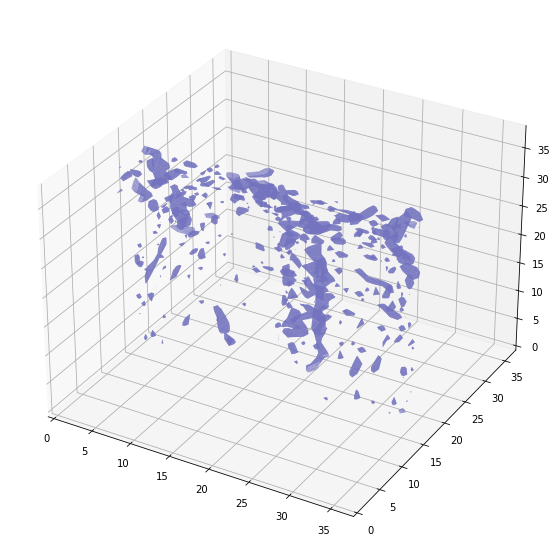

Shape before resampling	 (197, 512, 512)
Shape after resampling	 (37, 43, 43)


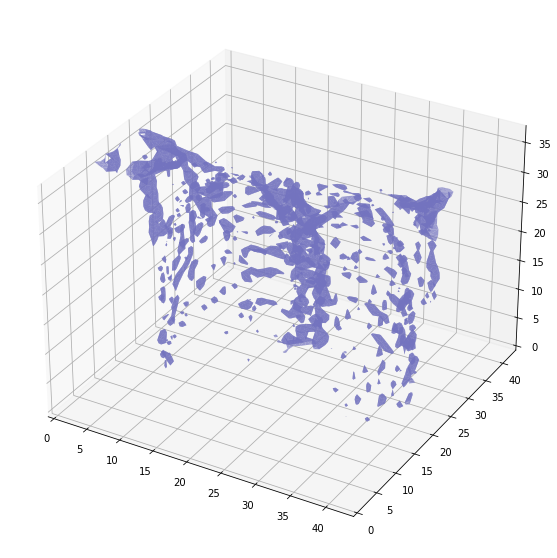

Shape before resampling	 (114, 512, 512)
Shape after resampling	 (43, 44, 44)


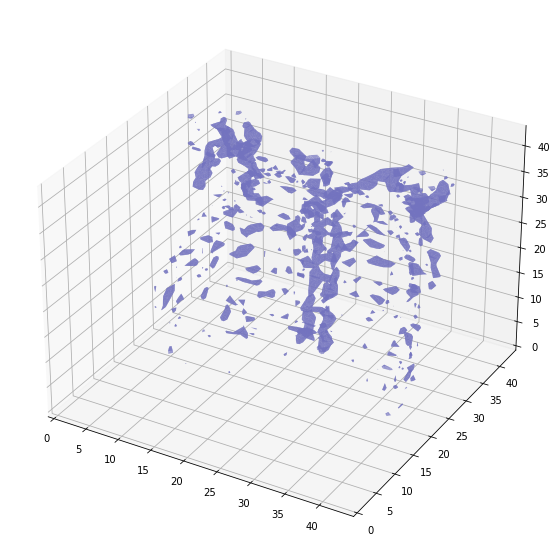

Shape before resampling	 (99, 512, 512)
Shape after resampling	 (37, 41, 41)


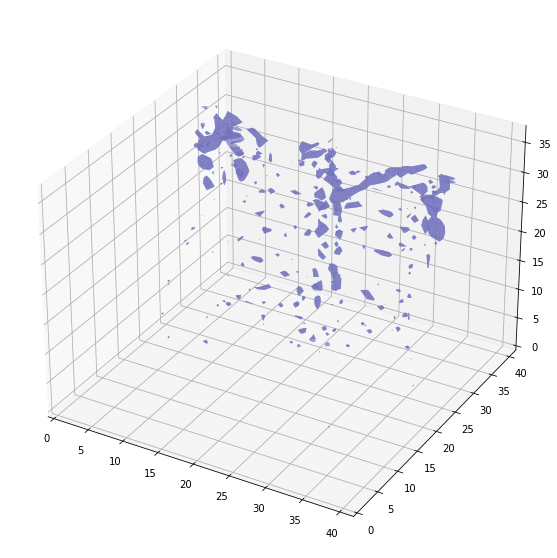

Shape before resampling	 (214, 512, 512)
Shape after resampling	 (40, 54, 54)


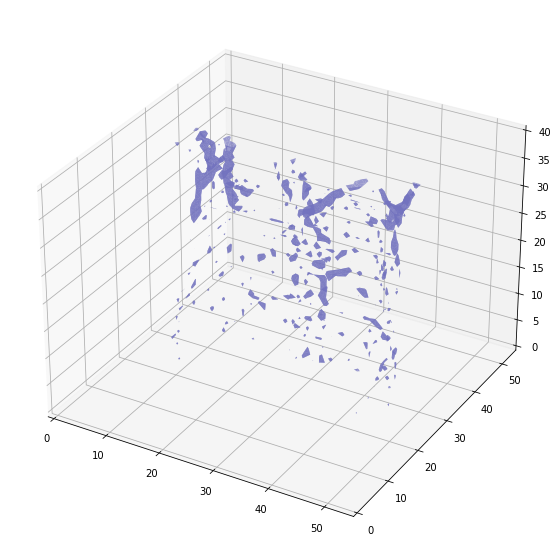

Shape before resampling	 (116, 512, 512)
Shape after resampling	 (44, 48, 48)


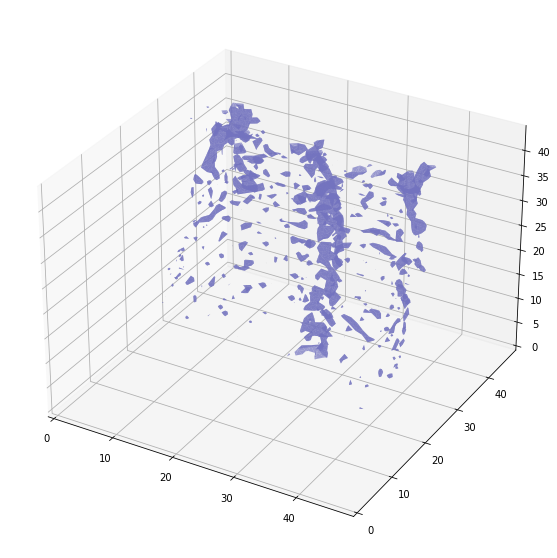

Shape before resampling	 (105, 512, 512)
Shape after resampling	 (39, 46, 46)


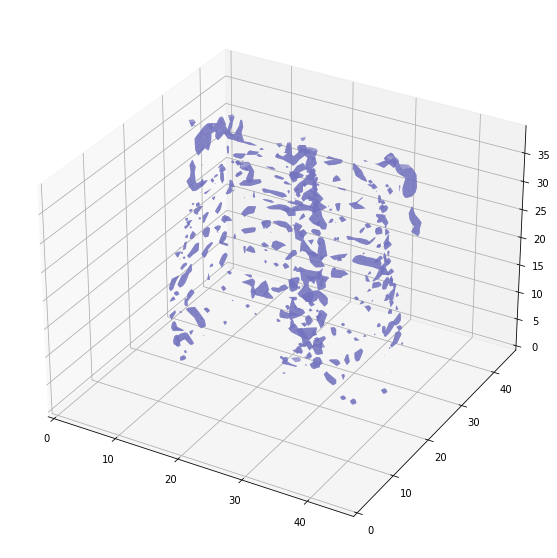

Shape before resampling	 (118, 512, 512)
Shape after resampling	 (44, 44, 44)


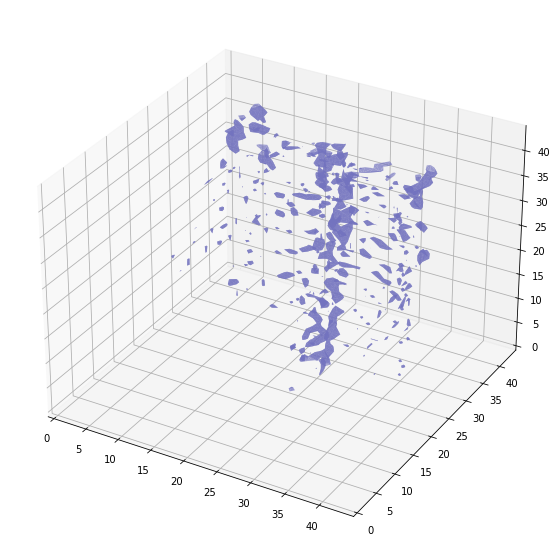

Shape before resampling	 (109, 512, 512)
Shape after resampling	 (41, 42, 42)


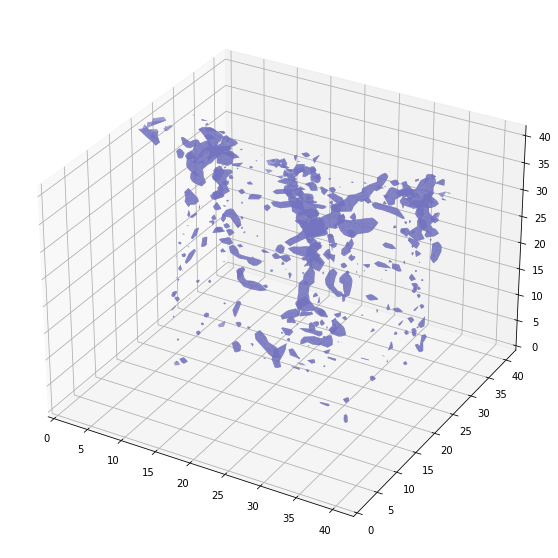

Shape before resampling	 (87, 512, 512)
Shape after resampling	 (33, 38, 38)


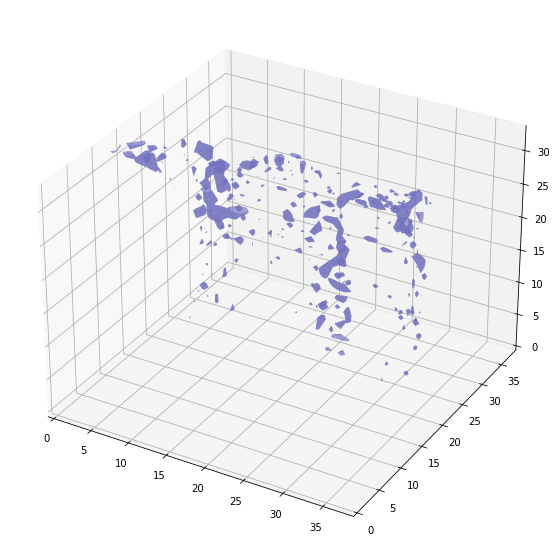

Shape before resampling	 (106, 512, 512)
Shape after resampling	 (40, 44, 44)


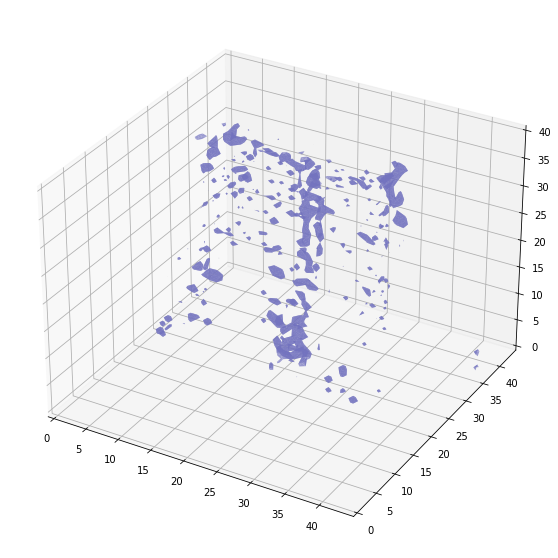

Shape before resampling	 (117, 512, 512)
Shape after resampling	 (44, 46, 46)


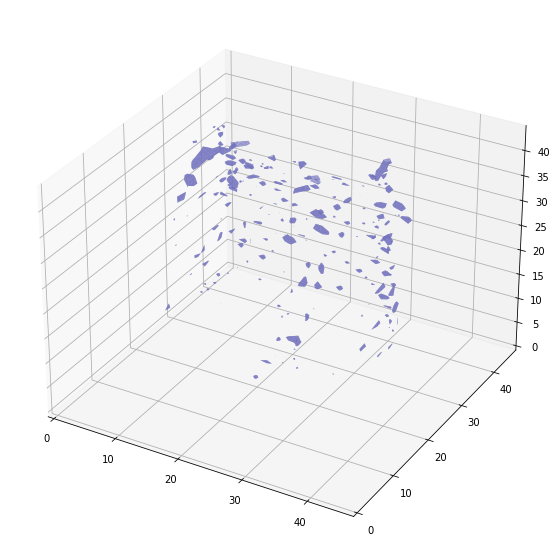

Shape before resampling	 (114, 512, 512)
Shape after resampling	 (43, 37, 37)


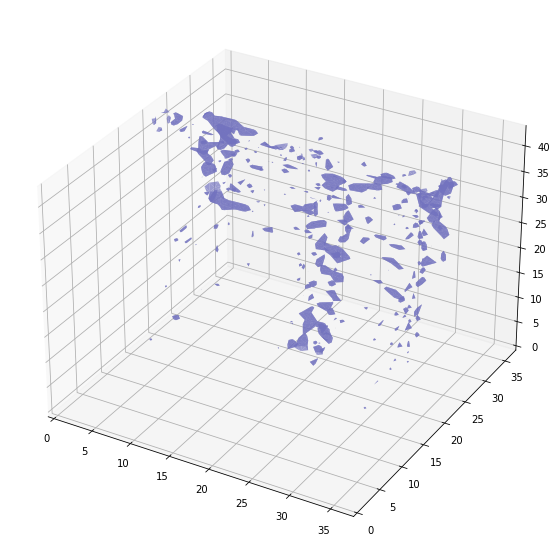

Shape before resampling	 (119, 512, 512)
Shape after resampling	 (45, 39, 39)


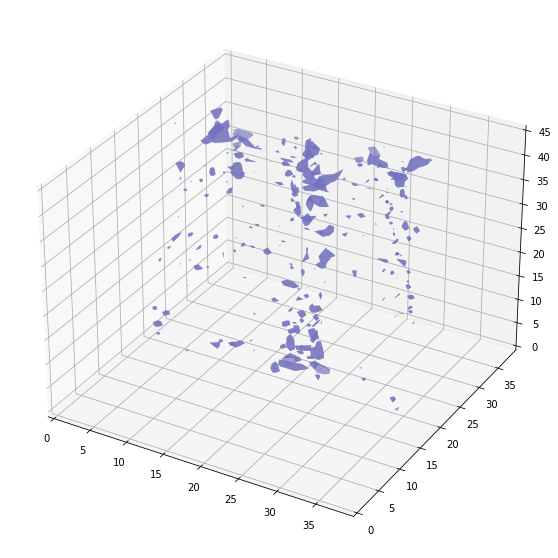

Shape before resampling	 (84, 512, 512)
Shape after resampling	 (32, 40, 40)


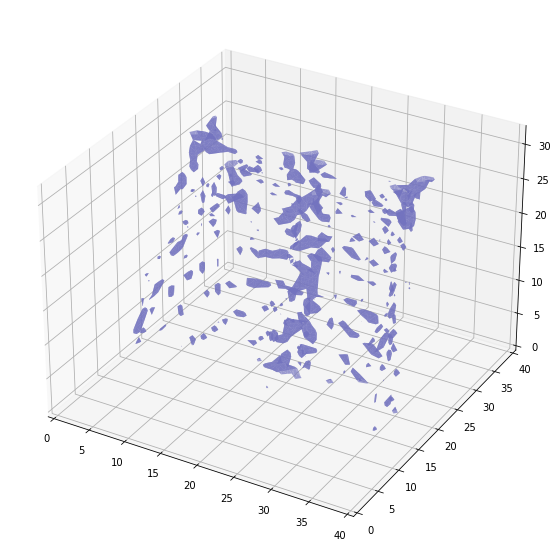

Shape before resampling	 (109, 512, 512)
Shape after resampling	 (41, 44, 44)


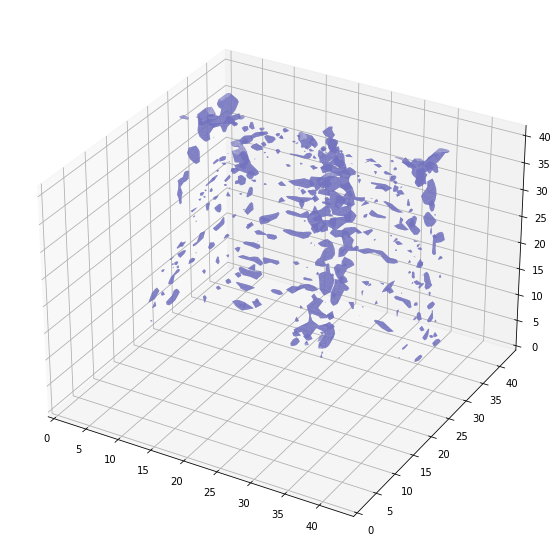

Shape before resampling	 (112, 512, 512)
Shape after resampling	 (42, 39, 39)


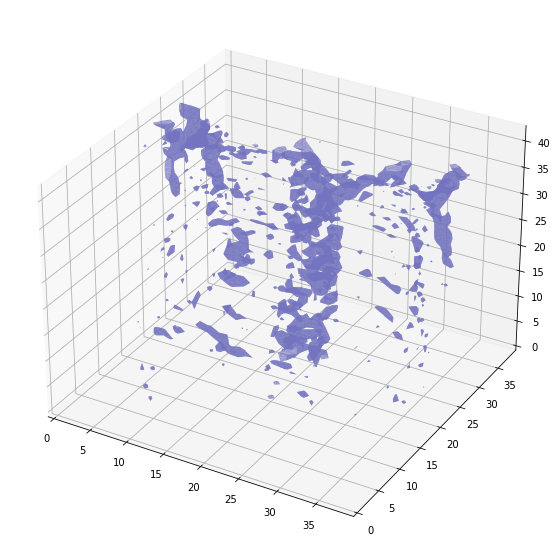

Shape before resampling	 (117, 512, 512)
Shape after resampling	 (44, 36, 36)


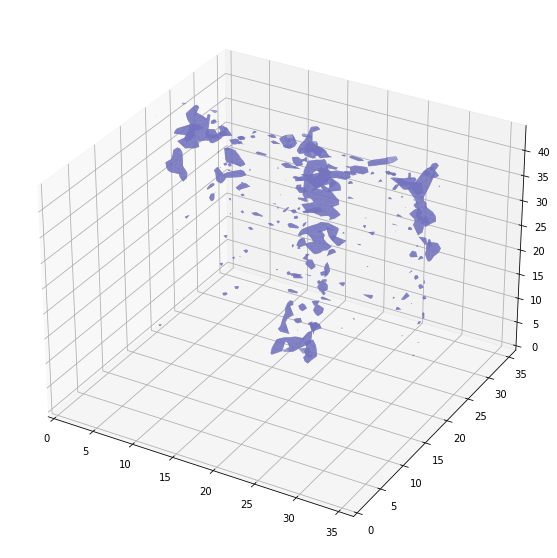

Shape before resampling	 (116, 512, 512)
Shape after resampling	 (44, 45, 45)


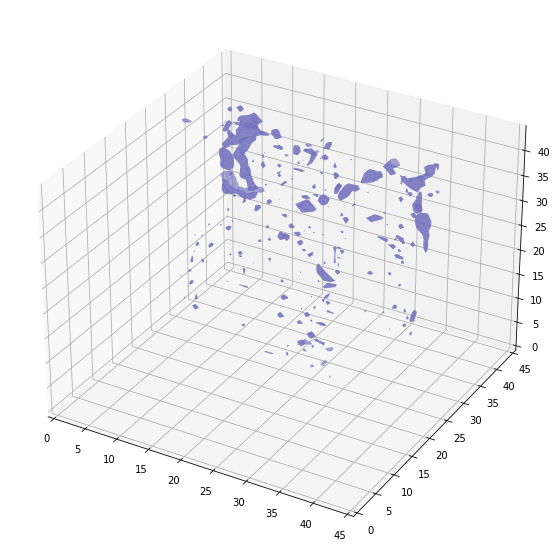

Shape before resampling	 (27, 512, 512)
Shape after resampling	 (10, 39, 39)


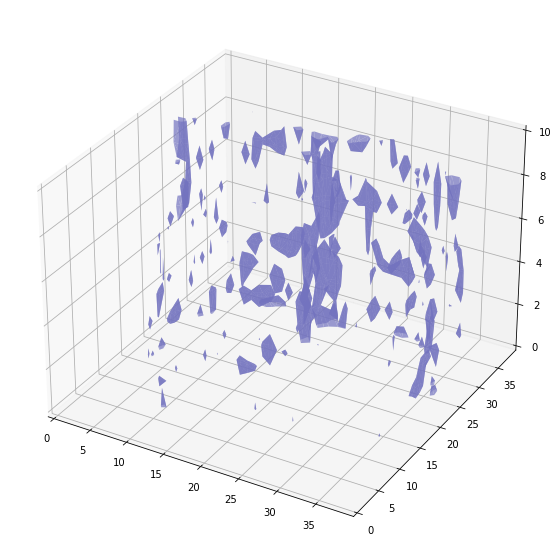

Shape before resampling	 (105, 512, 512)
Shape after resampling	 (39, 41, 41)


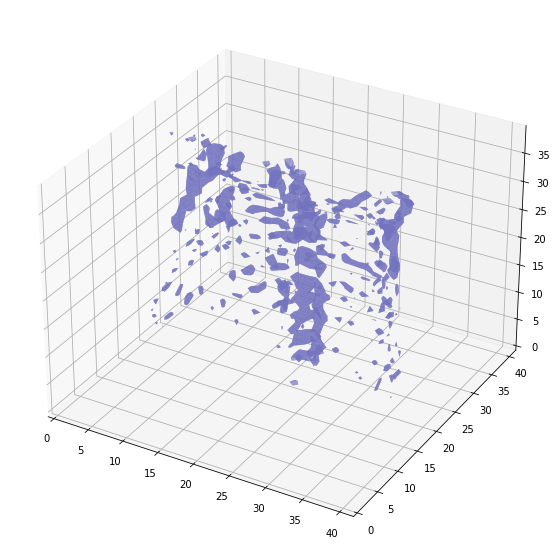

Shape before resampling	 (111, 512, 512)
Shape after resampling	 (42, 54, 54)


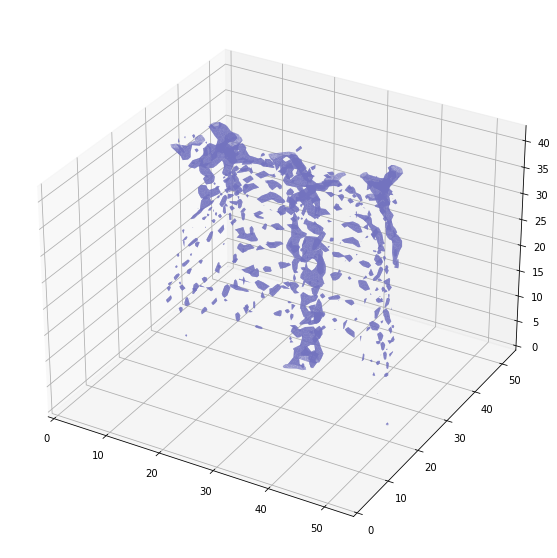

Shape before resampling	 (108, 512, 512)
Shape after resampling	 (40, 46, 46)


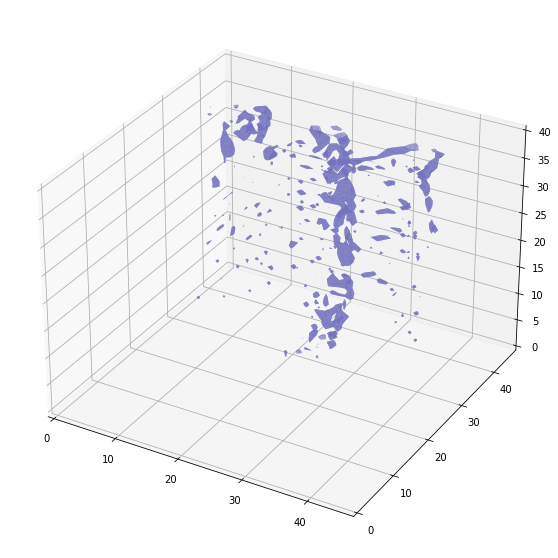

Shape before resampling	 (119, 512, 512)
Shape after resampling	 (45, 38, 38)


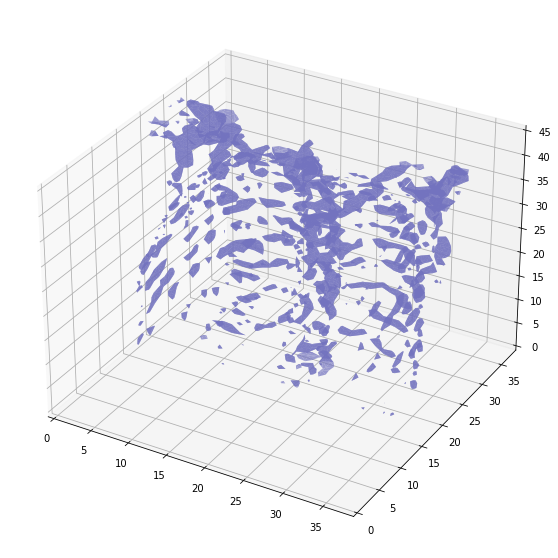

Shape before resampling	 (133, 512, 512)
Shape after resampling	 (50, 62, 62)


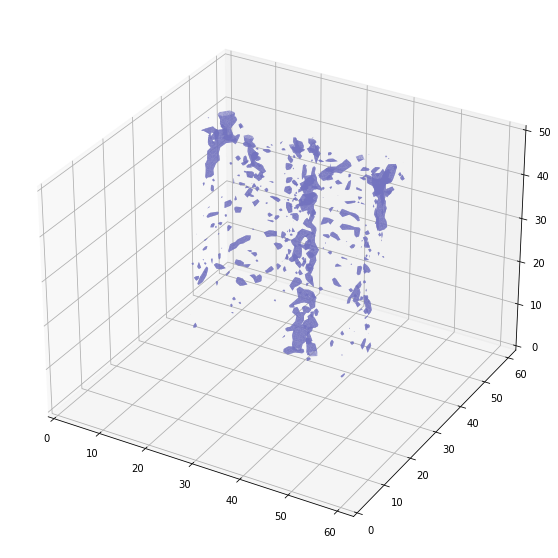

Shape before resampling	 (116, 512, 512)
Shape after resampling	 (44, 39, 39)


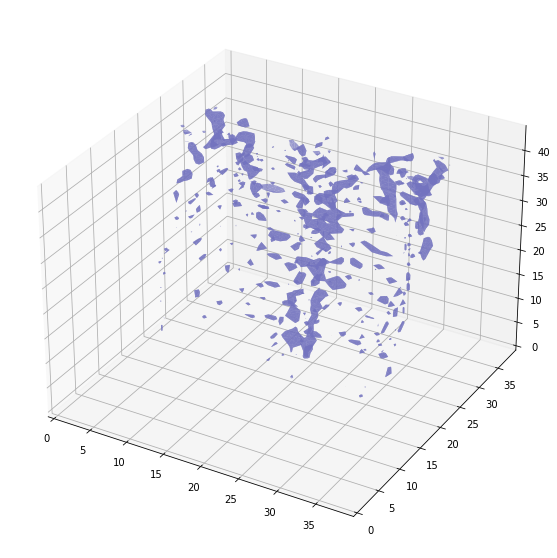

Shape before resampling	 (107, 512, 512)
Shape after resampling	 (40, 43, 43)


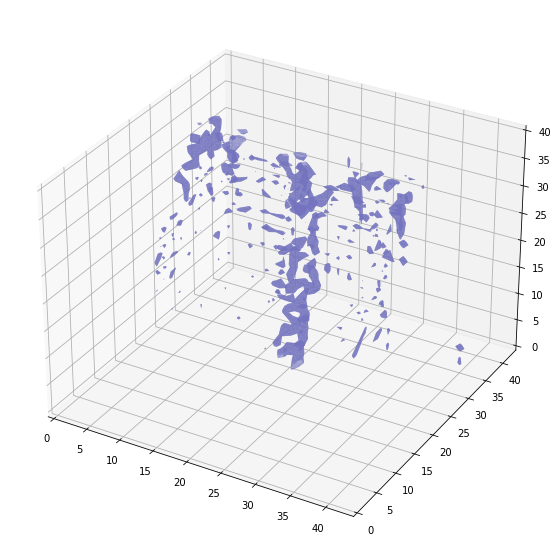

Shape before resampling	 (111, 512, 512)
Shape after resampling	 (42, 48, 48)


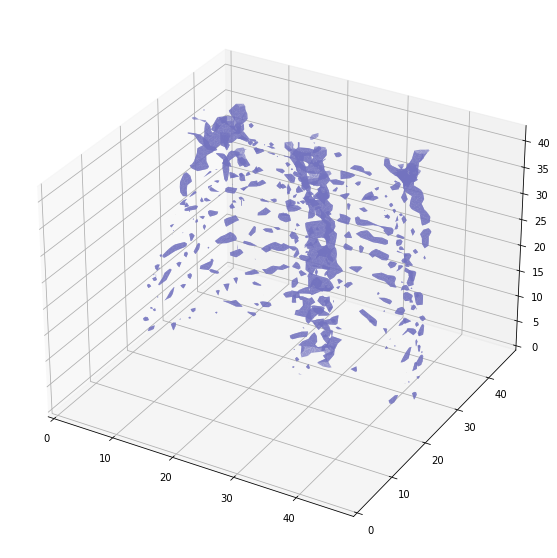

Shape before resampling	 (114, 512, 512)
Shape after resampling	 (43, 45, 45)


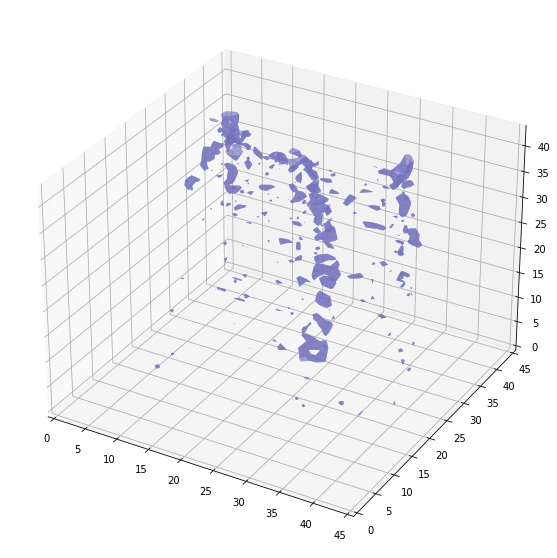

Shape before resampling	 (105, 512, 512)
Shape after resampling	 (39, 49, 49)


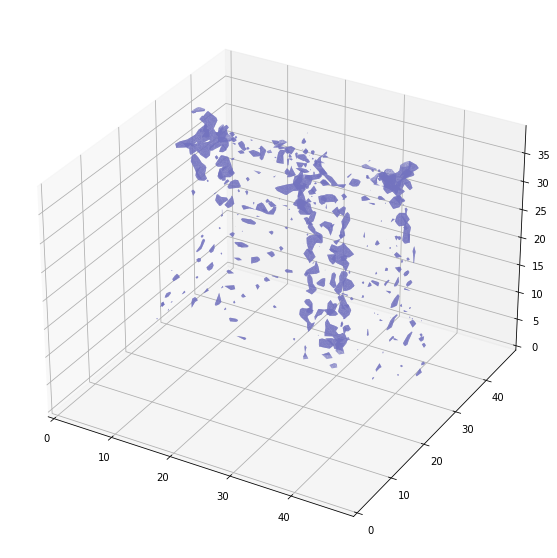

Shape before resampling	 (113, 512, 512)
Shape after resampling	 (42, 44, 44)


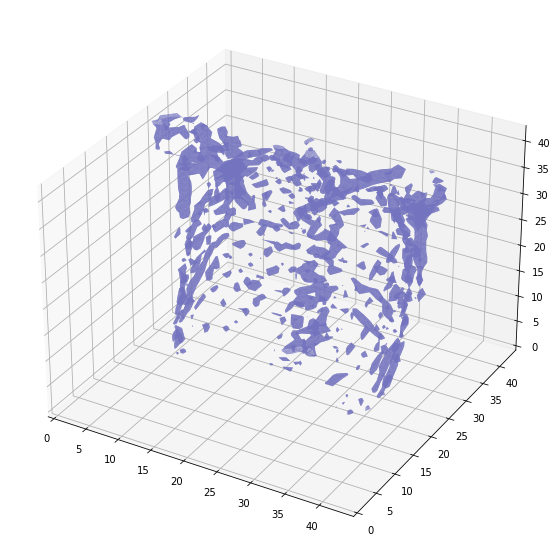

Shape before resampling	 (93, 512, 512)
Shape after resampling	 (35, 47, 47)


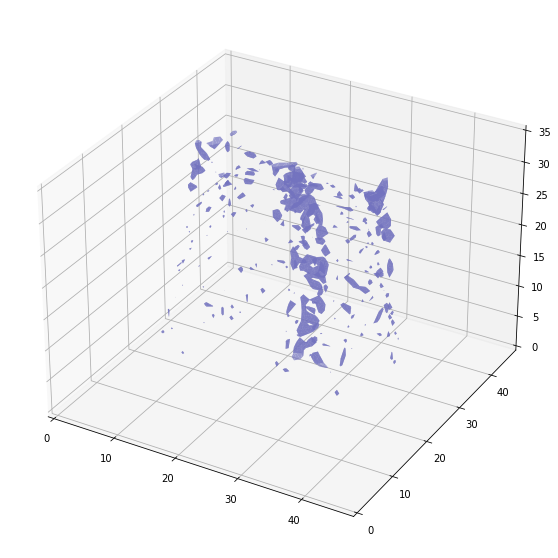

In [18]:
for patient in list_of_patients_b:
    raw_data = load_scan(patient)
    pixel_data = get_pixels_hu(raw_data)
    #show_all_frames(pixel_data)
    
    resampled_data, spacing = resample(pixel_data, raw_data, [8,8,8])
    print("Shape before resampling\t", pixel_data.shape)
    print("Shape after resampling\t", resampled_data.shape)
    
    plot_3d(resampled_data, 400)